In [12]:
# Import necessary libs
import pandas as pd
import numpy as np
%matplotlib inline
#matplotlib.use('TkAgg')  # or another suitable backend like 'Qt5Agg', 'GTK3Agg', etc.
import matplotlib.pyplot as plt
import seaborn as sns
import plotly.express as px
import plotly.graph_objects as go
import shap
import warnings
import missingno as msno
from ydata_profiling import ProfileReport
from scipy import stats
from yellowbrick.cluster import KElbowVisualizer
from sklearn.ensemble import RandomForestClassifier, GradientBoostingClassifier
from sklearn.metrics import classification_report, confusion_matrix, roc_curve, roc_auc_score, accuracy_score
from sklearn.model_selection import train_test_split, GridSearchCV
from sklearn.cluster import KMeans
from sklearn.preprocessing import StandardScaler, OneHotEncoder
from sklearn.decomposition import PCA
from sklearn.svm import SVC
from sklearn.neighbors import KNeighborsClassifier
from sklearn.manifold import TSNE
from sklearn.feature_selection import RFE
from sklearn.ensemble import VotingClassifier
# warnings.filterwarnings('ignore')
# Plot styles
plt.style.use('ggplot')
sns.set(style="whitegrid")   

In [13]:
# Read the data set
data = pd.read_csv('customer_segmentation_data.csv')
# Display first few rows
print(data.head())

   id  age  gender  income  spending_score  membership_years  \
0   1   38  Female   99342              90                 3   
1   2   21  Female   78852              60                 2   
2   3   60  Female  126573              30                 2   
3   4   40   Other   47099              74                 9   
4   5   65  Female  140621              21                 3   

   purchase_frequency preferred_category  last_purchase_amount  
0                  24          Groceries                113.53  
1                  42             Sports                 41.93  
2                  28           Clothing                424.36  
3                   5      Home & Garden                991.93  
4                  25        Electronics                347.08  


In [14]:
profile = ProfileReport(data, title="Customer Segmentation Data Profile", explorative=True)
profile.to_notebook_iframe()

Summarize dataset:   0%|          | 0/5 [00:00<?, ?it/s]

Generate report structure:   0%|          | 0/1 [00:00<?, ?it/s]

Render HTML:   0%|          | 0/1 [00:00<?, ?it/s]

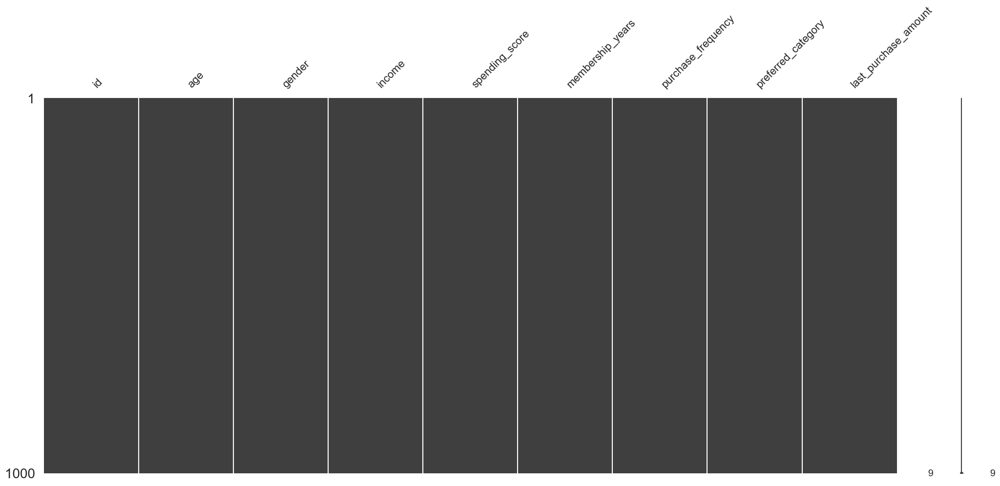

In [15]:
# A plot that shows missing vals if present
msno.matrix(data)
plt.show()

In [16]:
missing_values = data.isnull().sum()
print("\nChecking for missing values:")
print(missing_values)


Checking for missing values:
id                      0
age                     0
gender                  0
income                  0
spending_score          0
membership_years        0
purchase_frequency      0
preferred_category      0
last_purchase_amount    0
dtype: int64


In [17]:
data_statistics = data.describe()
print("\nBasic Stats:")
print(data_statistics)


Basic Stats:
                id          age         income  spending_score  \
count  1000.000000  1000.000000    1000.000000     1000.000000   
mean    500.500000    43.783000   88500.800000       50.685000   
std     288.819436    15.042213   34230.771122       28.955175   
min       1.000000    18.000000   30004.000000        1.000000   
25%     250.750000    30.000000   57911.750000       26.000000   
50%     500.500000    45.000000   87845.500000       50.000000   
75%     750.250000    57.000000  116110.250000       76.000000   
max    1000.000000    69.000000  149973.000000      100.000000   

       membership_years  purchase_frequency  last_purchase_amount  
count        1000.00000         1000.000000           1000.000000  
mean            5.46900           26.596000            492.348670  
std             2.85573           14.243654            295.744253  
min             1.00000            1.000000             10.400000  
25%             3.00000           15.000000        

In [19]:
print("\nDisplaying the columns:")
print(data.columns)


Displaying the columns:
Index(['id', 'age', 'gender', 'income', 'spending_score', 'membership_years',
       'purchase_frequency', 'preferred_category', 'last_purchase_amount'],
      dtype='object')


In [22]:
print("\nData types:")
print(data.dtypes)


Data types:
id                        int64
age                       int64
gender                   object
income                    int64
spending_score            int64
membership_years          int64
purchase_frequency        int64
preferred_category       object
last_purchase_amount    float64
dtype: object


In [23]:
print("\nUnique Values in each Columns:")
print(data.nunique())


Unique Values in each Columns:
id                      1000
age                       52
gender                     3
income                   996
spending_score           100
membership_years          10
purchase_frequency        50
preferred_category         5
last_purchase_amount     994
dtype: int64


In [24]:
categorical_columns = data.select_dtypes(include=['object']).columns
for column in categorical_columns:
    print(f"\n{column} Vals and numbers:")
    print(data[column].value_counts())


gender Vals and numbers:
gender
Male      357
Other     327
Female    316
Name: count, dtype: int64

preferred_category Vals and numbers:
preferred_category
Electronics      215
Sports           210
Home & Garden    206
Groceries        199
Clothing         170
Name: count, dtype: int64


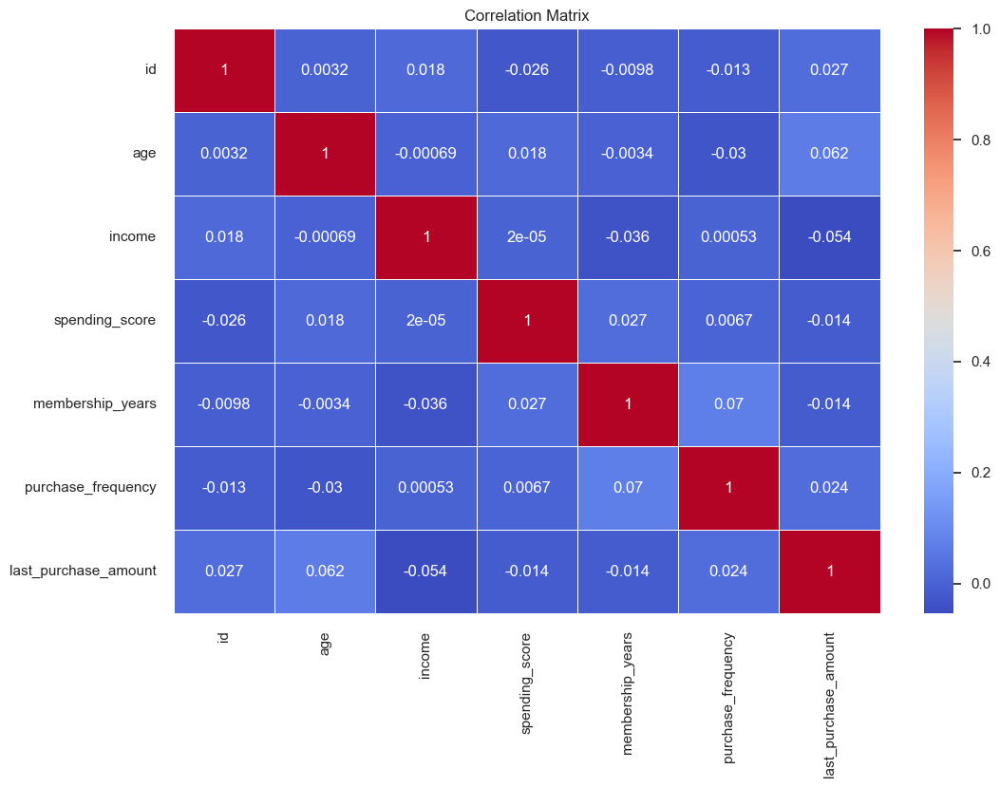

In [25]:
# Numeric columns only selected
numeric_data = data.select_dtypes(include=[np.number])

# displaying correlations between numeric columns
plt.figure(figsize=(12, 8))
correlation_matrix = numeric_data.corr()
sns.heatmap(correlation_matrix, annot=True, cmap='coolwarm', linewidths=0.5)
plt.title('Correlation Matrix')
plt.show()

In [26]:
# cross-tabulate the relationship between gender and preferred category
print("\nRelationship Between Gender and Preferred Category:")
gender_category_crosstab = pd.crosstab(data['gender'], data['preferred_category'])
print(gender_category_crosstab)


Relationship Between Gender and Preferred Category:
preferred_category  Clothing  Electronics  Groceries  Home & Garden  Sports
gender                                                                     
Female                    56           65         66             68      61
Male                      56           76         71             77      77
Other                     58           74         62             61      72


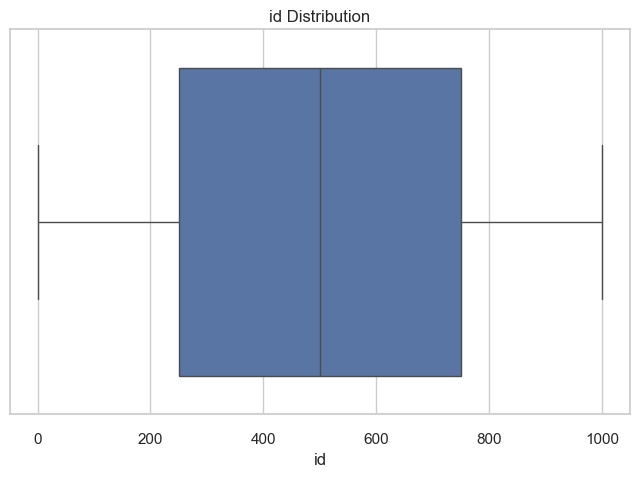

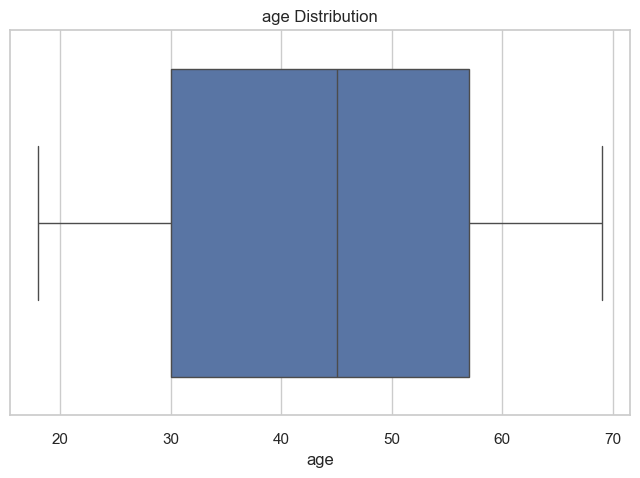

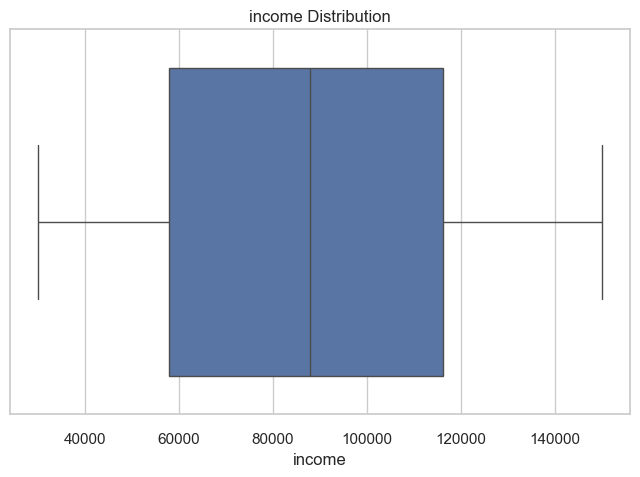

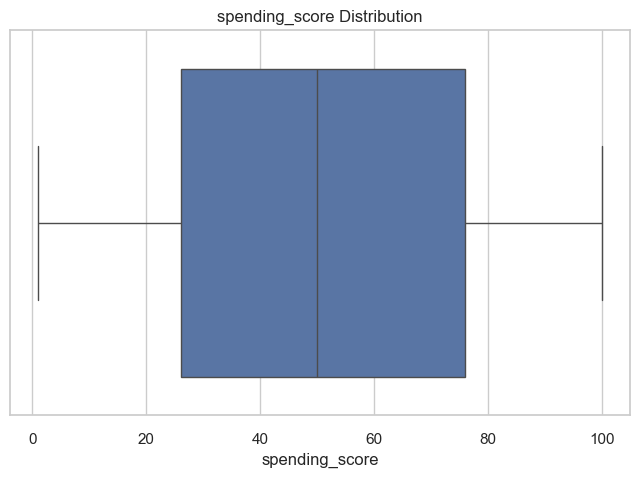

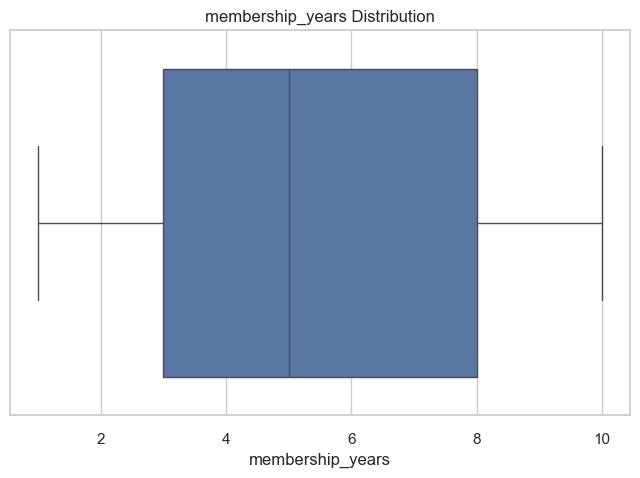

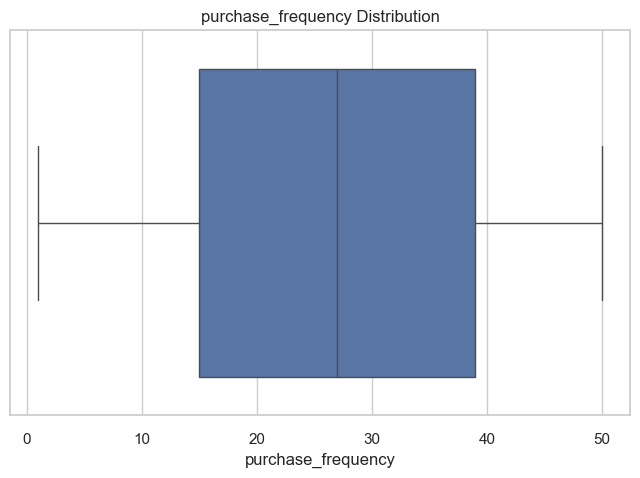

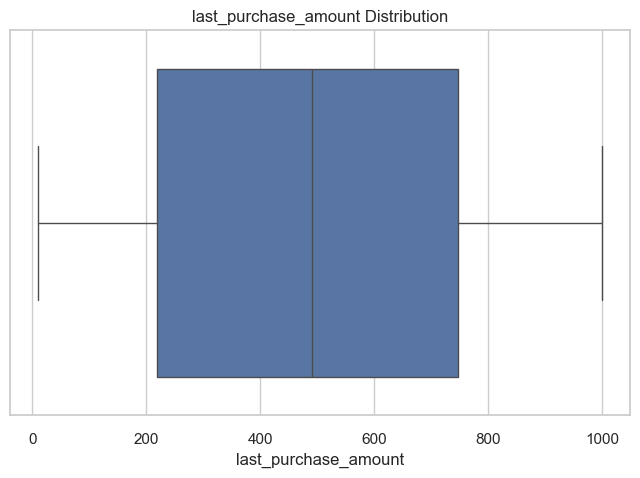

In [27]:
# polar plot for numeric columns
numeric_columns = data.select_dtypes(include=[np.number]).columns
for column in numeric_columns:
    plt.figure(figsize=(8, 5))
    sns.boxplot(x=data[column])
    plt.title(f'{column} Distribution')
    plt.show()

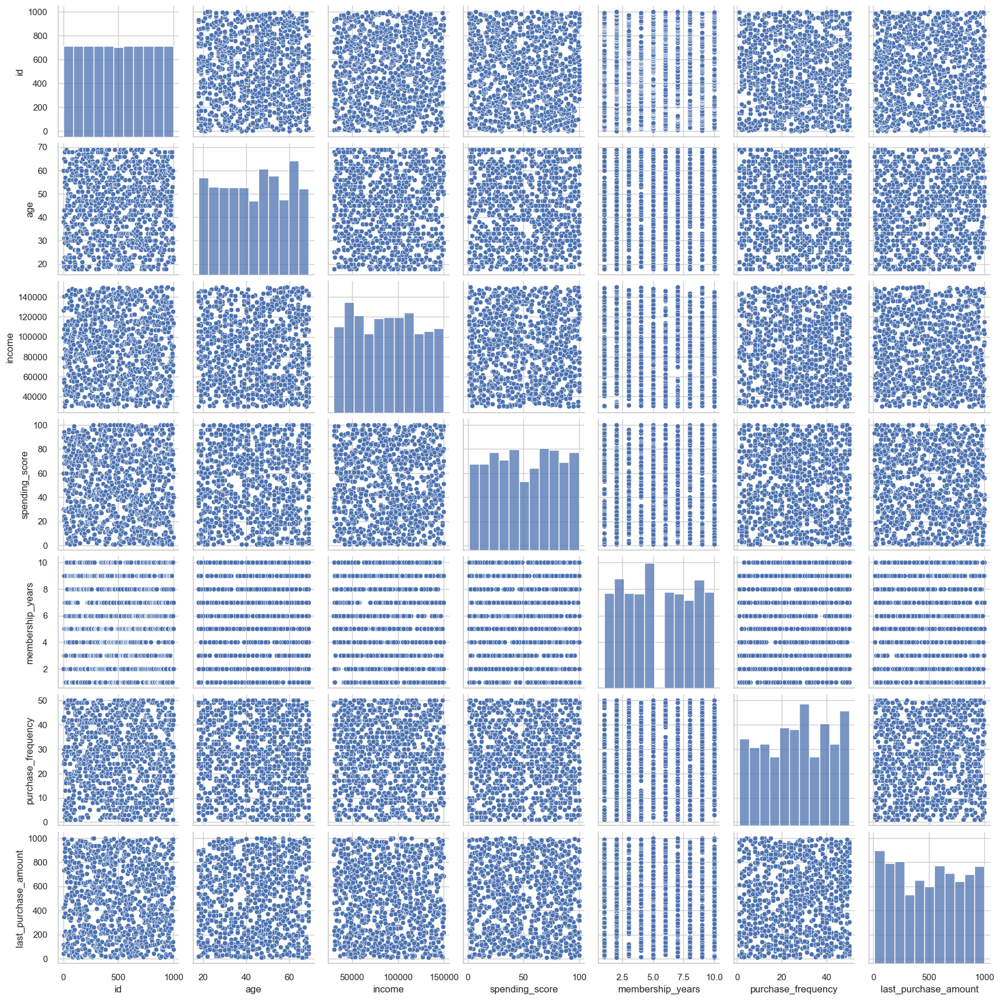

In [28]:
# only select numeric columns
numeric_data = data.select_dtypes(include=[np.number])

# remove infinite (inf) and NaN values
numeric_data = numeric_data.replace([np.inf, -np.inf], np.nan).dropna()

# drawing pairplots for numeric columns
sns.pairplot(numeric_data)
plt.show()

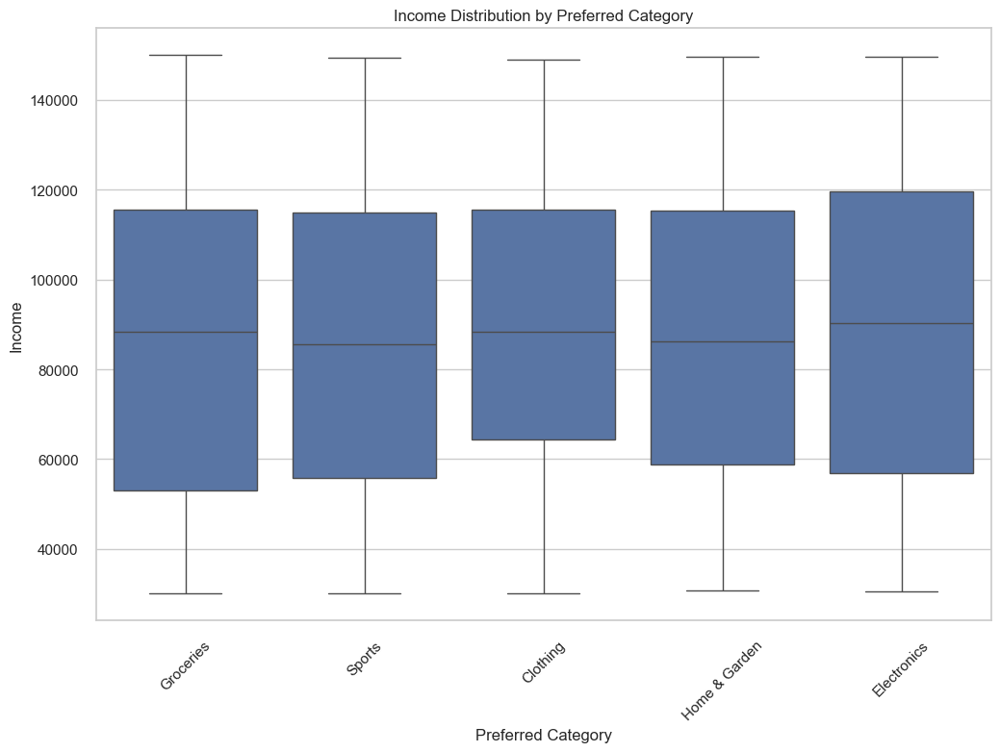

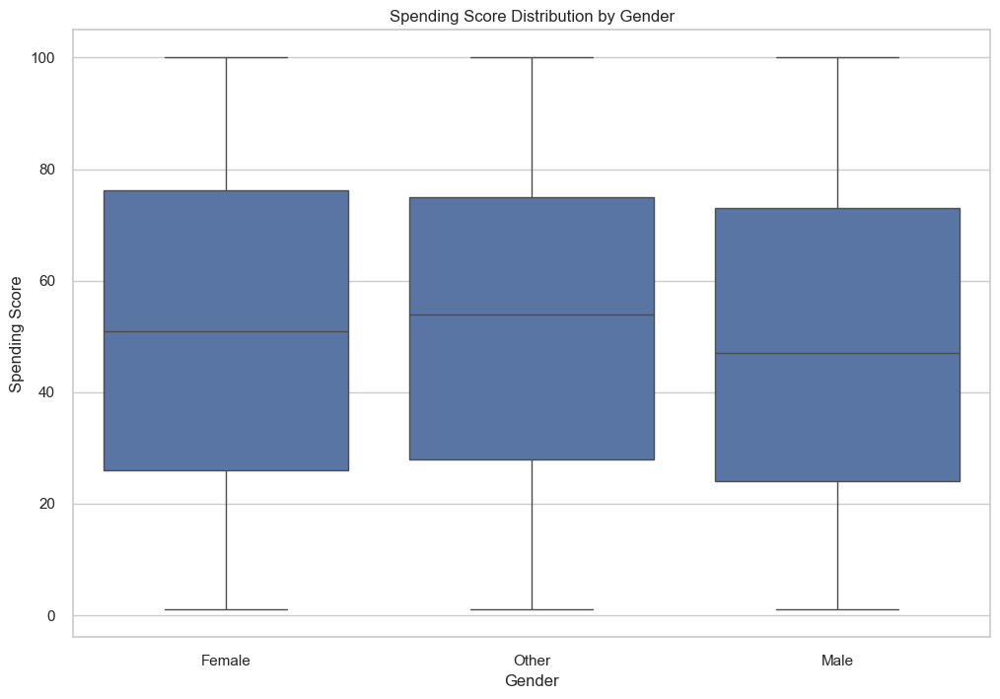

In [29]:
# Examining categorical and numerical variables together
plt.figure(figsize=(12, 8))
sns.boxplot(x='preferred_category', y='income', data=data)
plt.title('Income Distribution by Preferred Category')
plt.xlabel('Preferred Category')
plt.ylabel('Income')
plt.xticks(rotation=45)
plt.show()

plt.figure(figsize=(12, 8))
sns.boxplot(x='gender', y='spending_score', data=data)
plt.title('Spending Score Distribution by Gender')
plt.xlabel('Gender')
plt.ylabel('Spending Score')
plt.show()

In [30]:
# displaying the most frequent values in the dataset
for column in data.columns:
    print(f"\n{column} Most Frequent Values in Column:")
    print(data[column].value_counts().head())


id Most Frequent Values in Column:
id
1      1
672    1
659    1
660    1
661    1
Name: count, dtype: int64

age Most Frequent Values in Column:
age
47    32
30    30
33    29
45    29
53    28
Name: count, dtype: int64

gender Most Frequent Values in Column:
gender
Male      357
Other     327
Female    316
Name: count, dtype: int64

income Most Frequent Values in Column:
income
49020     2
39407     2
137307    2
61376     2
54274     1
Name: count, dtype: int64

spending_score Most Frequent Values in Column:
spending_score
70     20
27     19
96     17
100    17
83     16
Name: count, dtype: int64

membership_years Most Frequent Values in Column:
membership_years
5     125
2     109
9     108
6      96
10     96
Name: count, dtype: int64

purchase_frequency Most Frequent Values in Column:
purchase_frequency
28    35
42    30
27    30
49    29
31    27
Name: count, dtype: int64

preferred_category Most Frequent Values in Column:
preferred_category
Electronics      215
Sports        

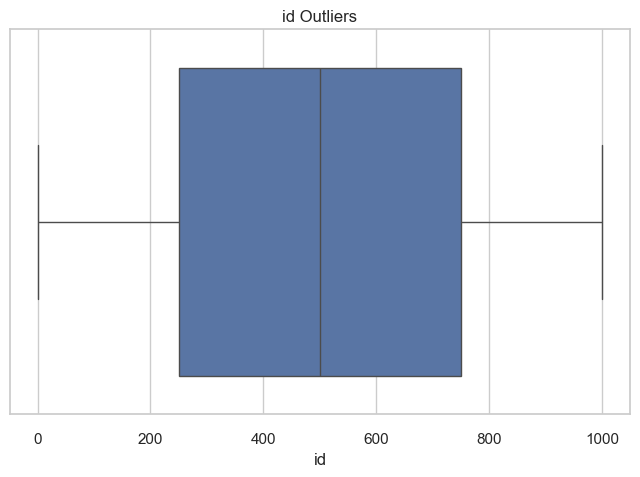

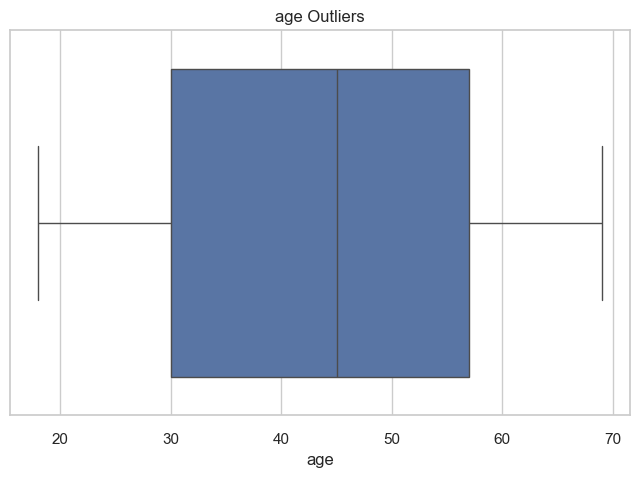

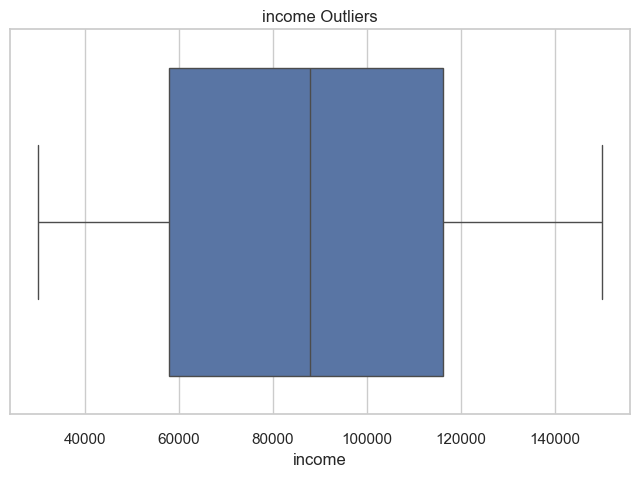

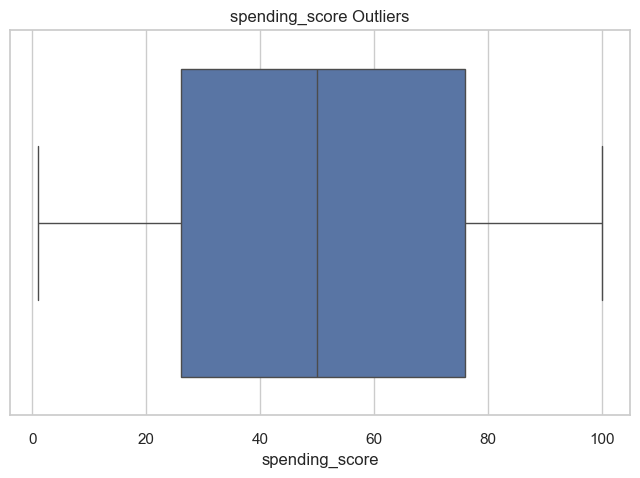

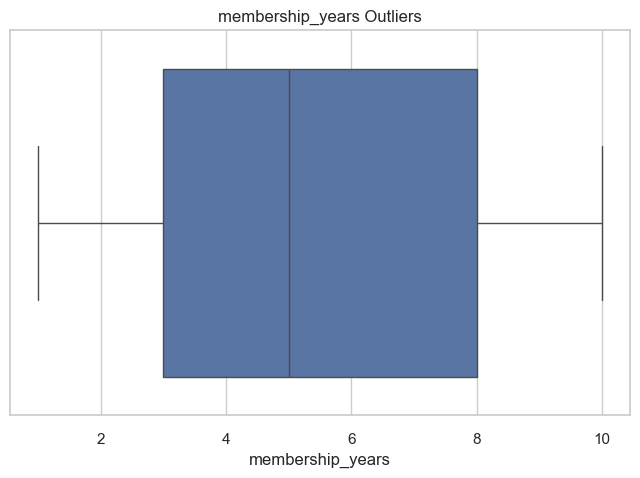

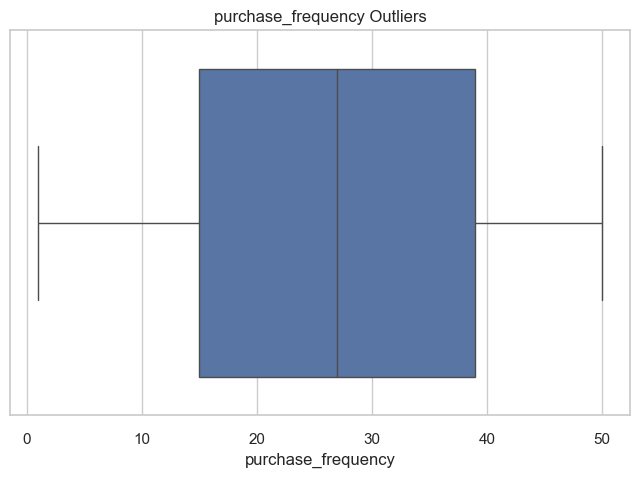

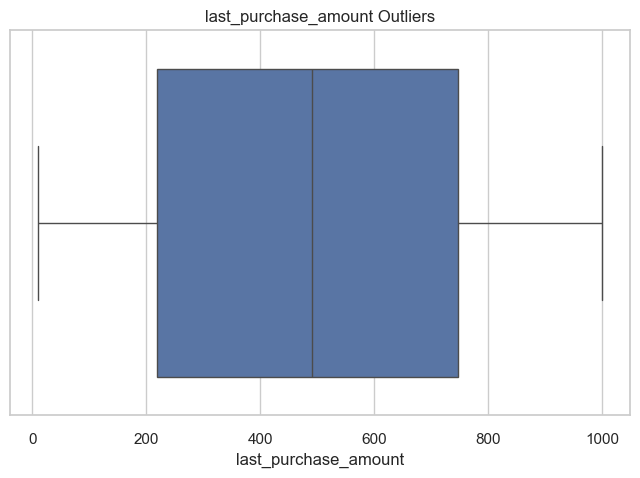

In [31]:
# detect anomalies (outliers) for numeric columns
for column in numeric_columns:
    plt.figure(figsize=(8, 5))
    sns.boxplot(x=data[column])
    plt.title(f'{column} Outliers')
    plt.show()

In [32]:
# calculate the percentage of missing values ​​in each column
print("\nPercentage of Missing Values ​​in Each Column:")
missing_percentage = data.isnull().mean() * 100
print(missing_percentage)


Percentage of Missing Values ​​in Each Column:
id                      0.0
age                     0.0
gender                  0.0
income                  0.0
spending_score          0.0
membership_years        0.0
purchase_frequency      0.0
preferred_category      0.0
last_purchase_amount    0.0
dtype: float64


In [33]:
# display basic statistics of each column
print("\nBasic stats of each colums:")
for column in data.columns:
    print(f"\n{column} Basic Statistics of each Column:")
    print(data[column].describe())


Basic stats of each colums:

id Basic Statistics of each Column:
count    1000.000000
mean      500.500000
std       288.819436
min         1.000000
25%       250.750000
50%       500.500000
75%       750.250000
max      1000.000000
Name: id, dtype: float64

age Basic Statistics of each Column:
count    1000.000000
mean       43.783000
std        15.042213
min        18.000000
25%        30.000000
50%        45.000000
75%        57.000000
max        69.000000
Name: age, dtype: float64

gender Basic Statistics of each Column:
count     1000
unique       3
top       Male
freq       357
Name: gender, dtype: object

income Basic Statistics of each Column:
count      1000.000000
mean      88500.800000
std       34230.771122
min       30004.000000
25%       57911.750000
50%       87845.500000
75%      116110.250000
max      149973.000000
Name: income, dtype: float64

spending_score Basic Statistics of each Column:
count    1000.000000
mean       50.685000
std        28.955175
min         1.

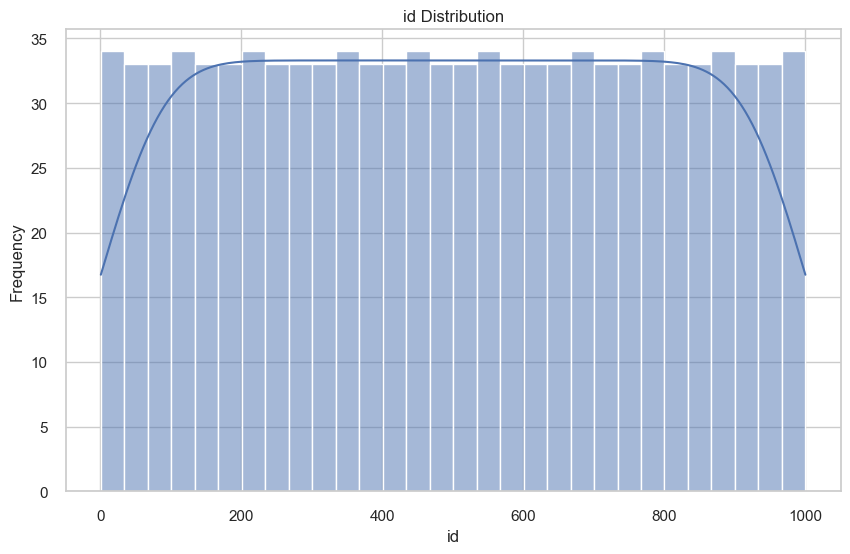

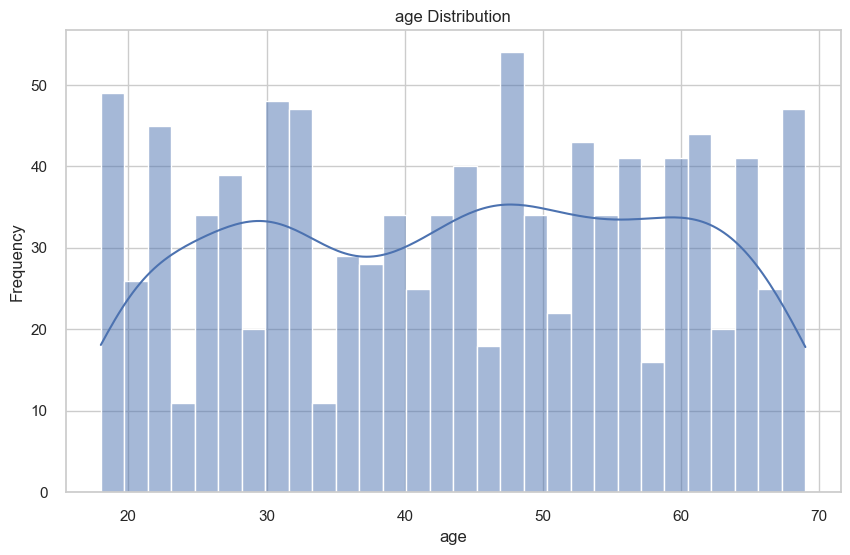

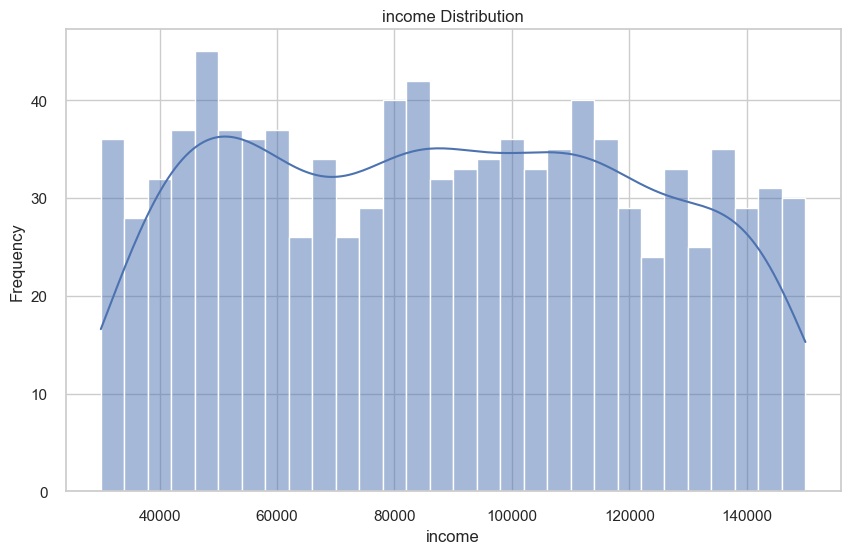

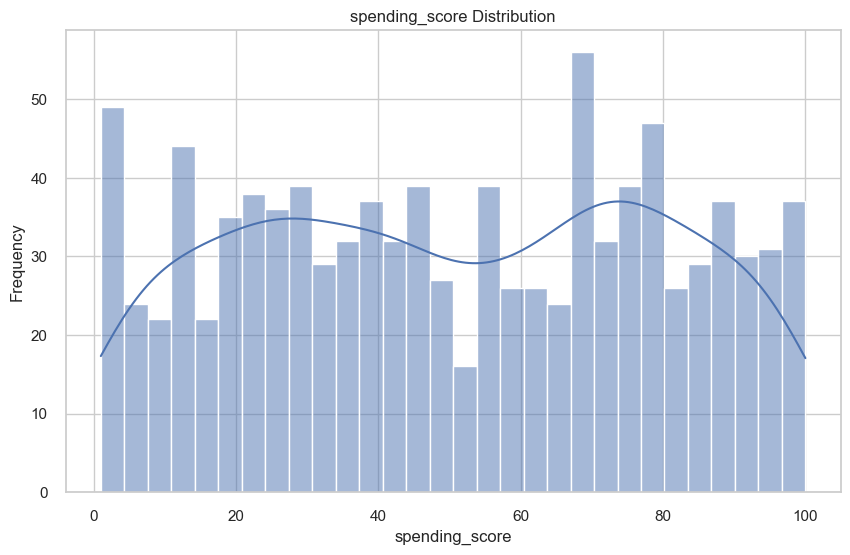

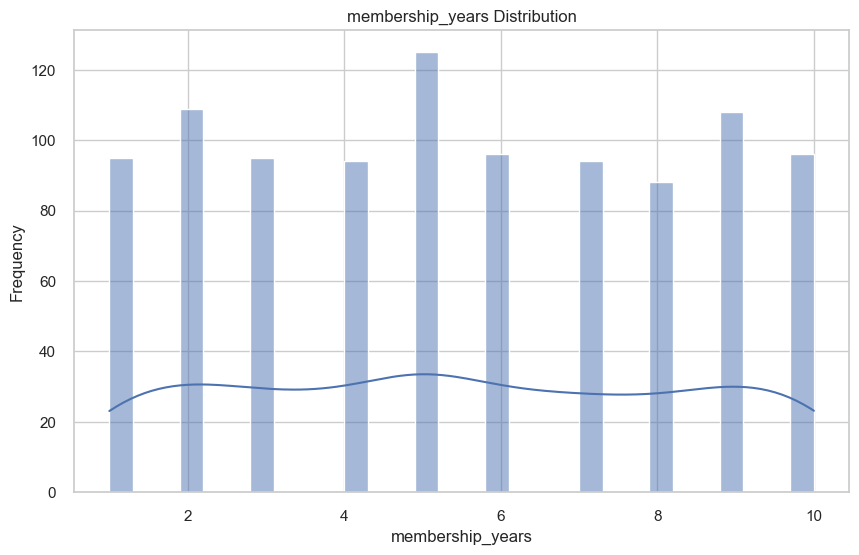

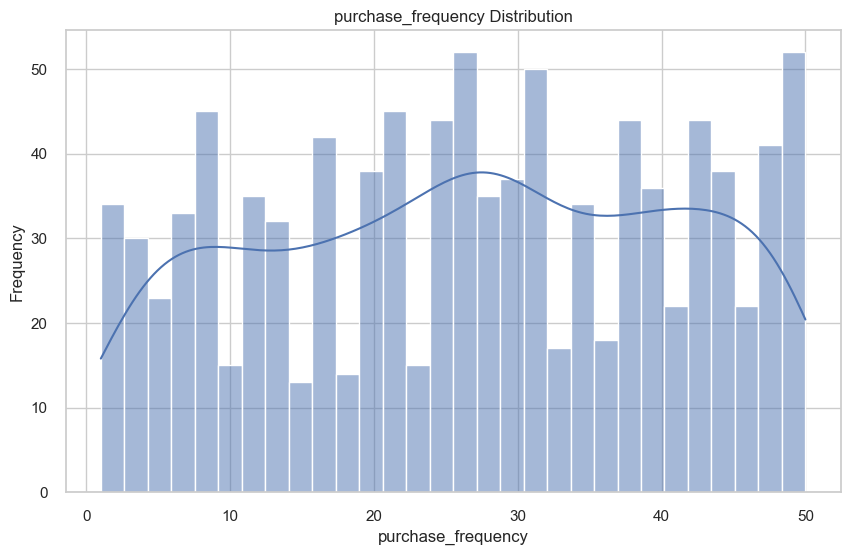

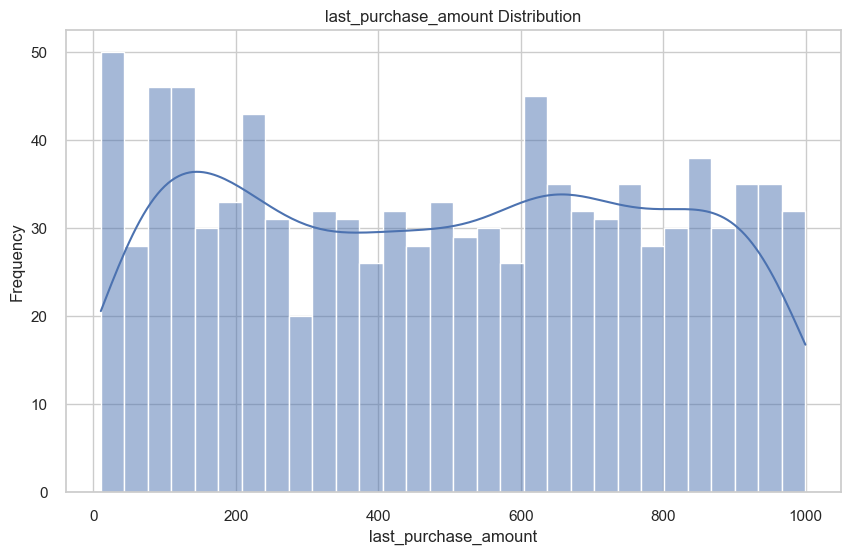

In [34]:
# draw a scatter plot of each column
for column in data.select_dtypes(include=[np.number]).columns:
    plt.figure(figsize=(10, 6))
    sns.histplot(data[column], bins=30, kde=True)
    plt.title(f'{column} Distribution')
    plt.xlabel(column)
    plt.ylabel('Frequency')
    plt.show()

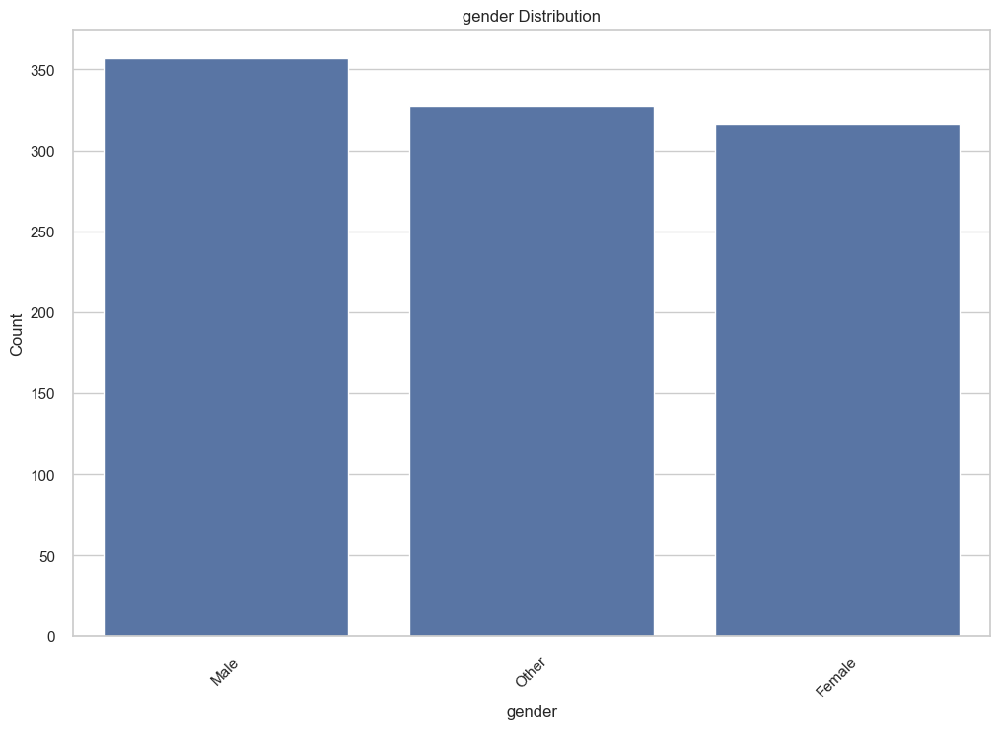

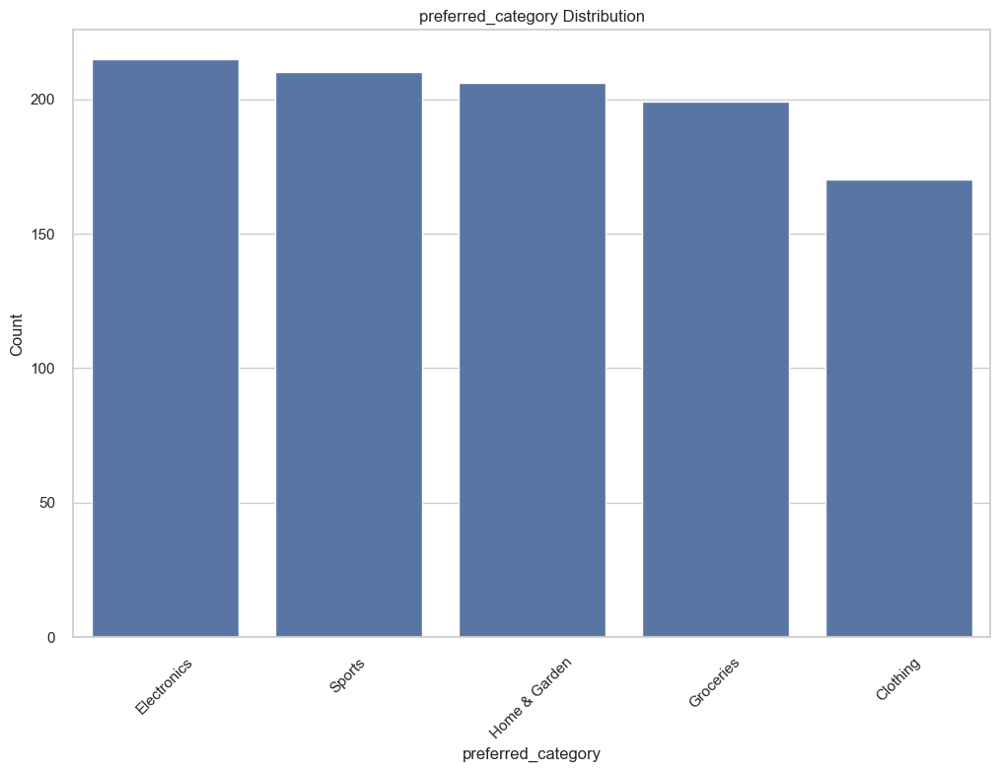

In [35]:
# draw a scatter plot of categorical columns
for column in data.select_dtypes(include=[object]).columns:
    plt.figure(figsize=(12, 8))
    sns.countplot(x=data[column], order=data[column].value_counts().index)
    plt.title(f'{column} Distribution')
    plt.xlabel(column)
    plt.ylabel('Count')
    plt.xticks(rotation=45)
    plt.show()

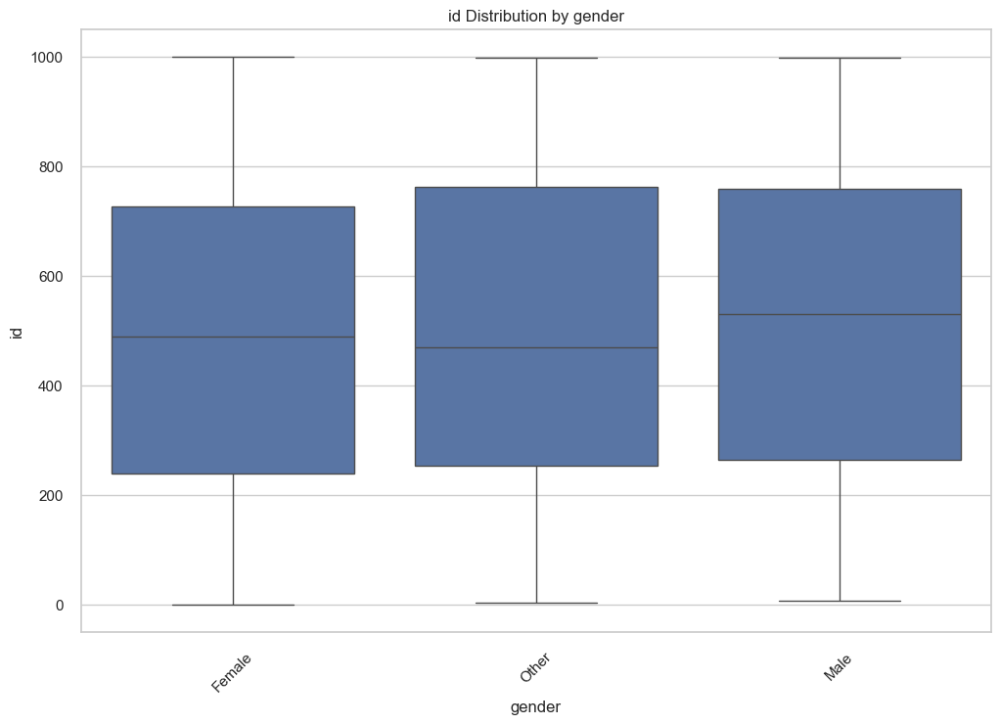

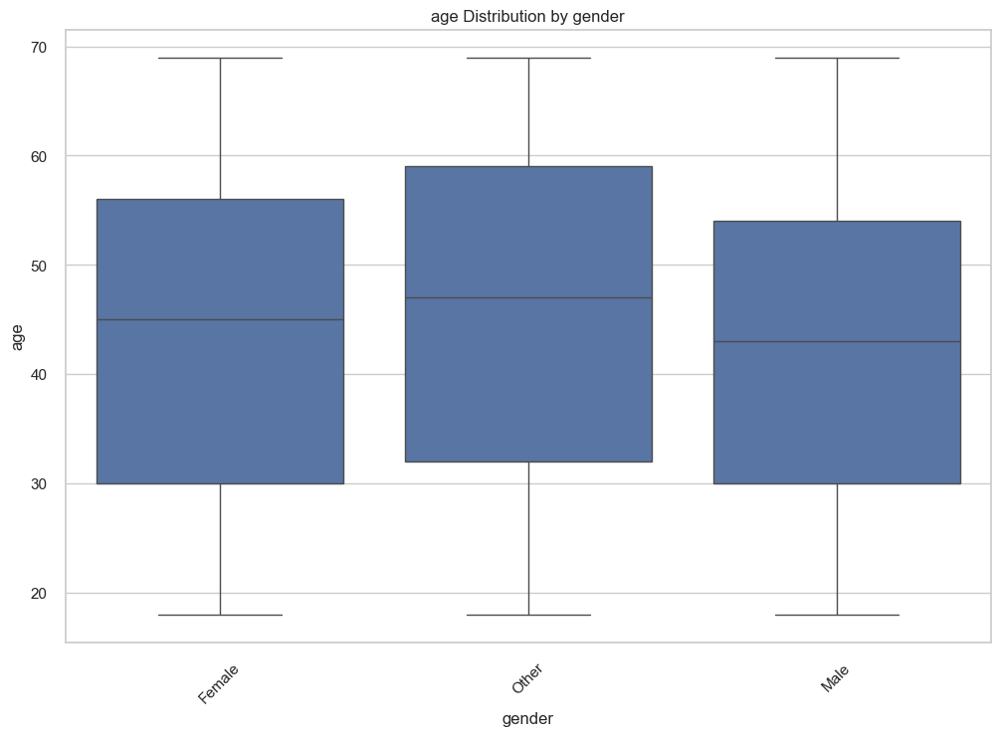

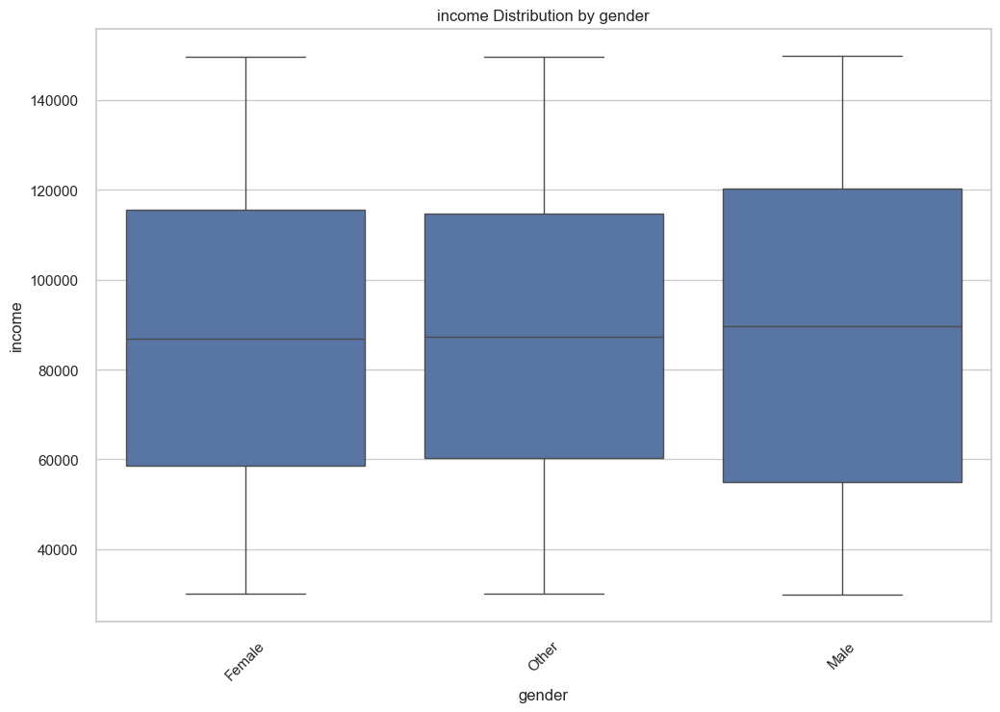

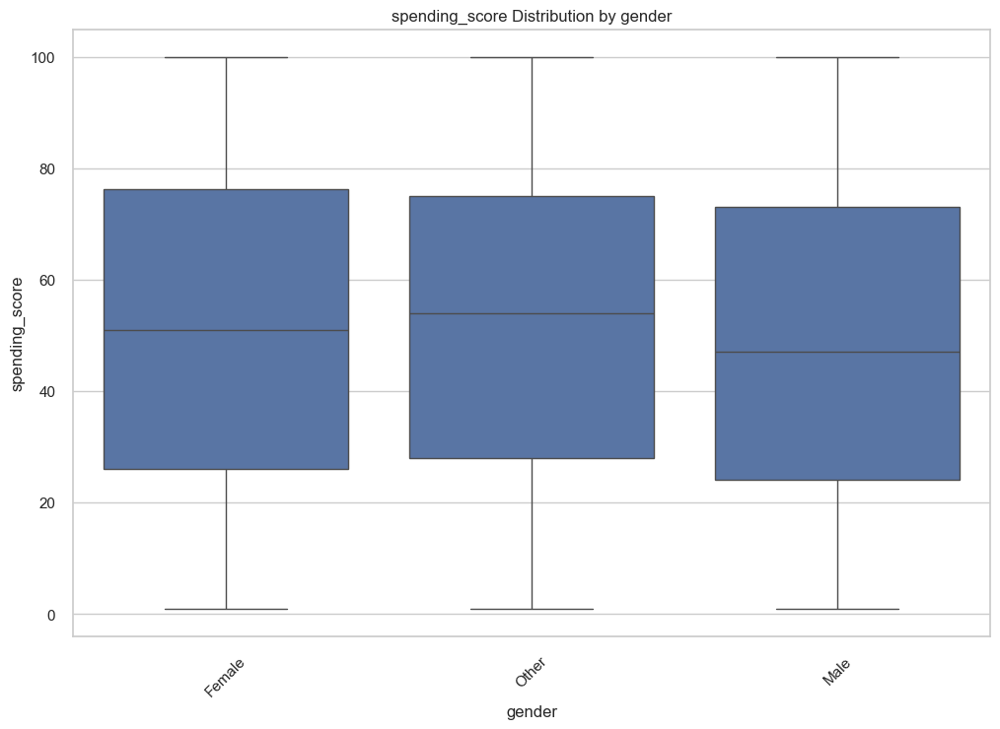

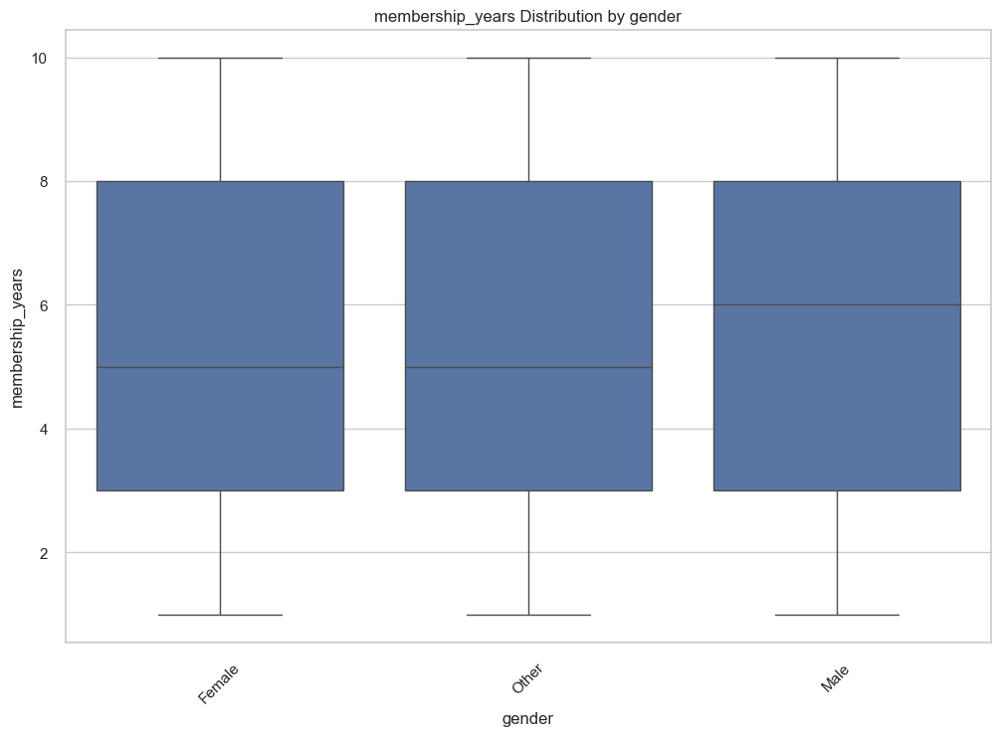

...

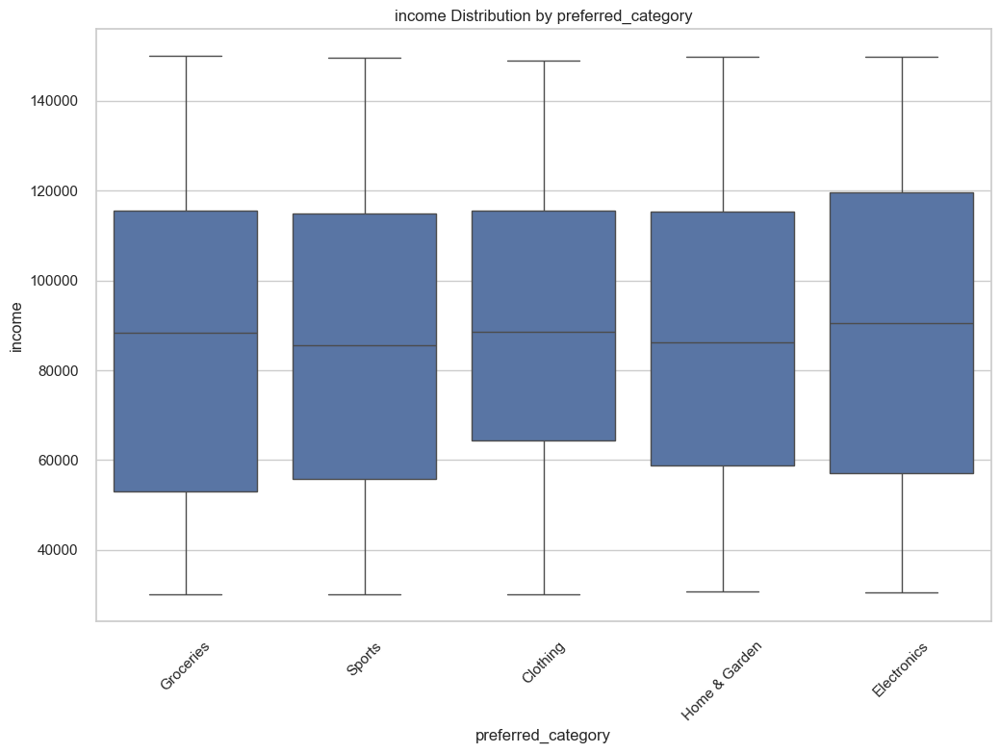

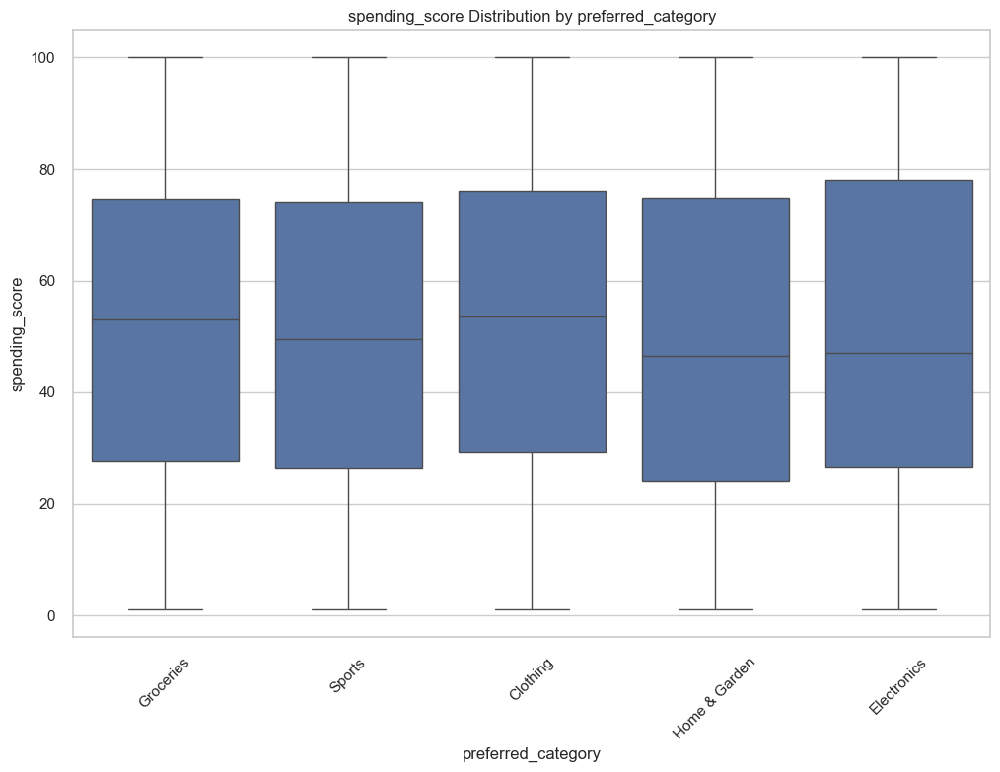

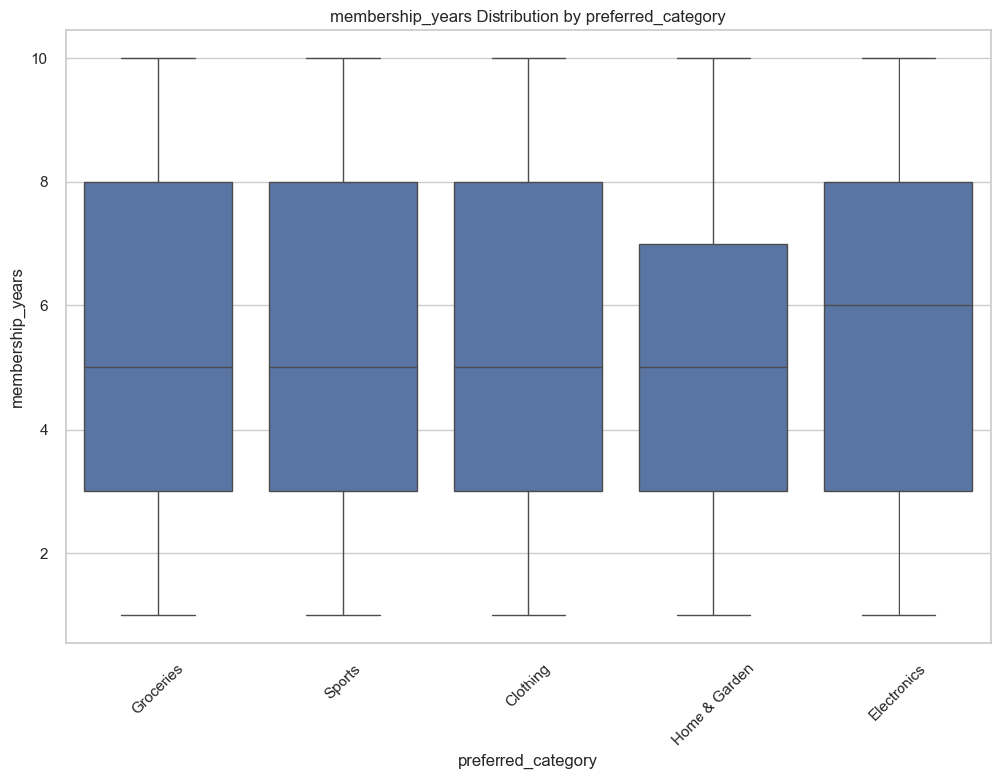

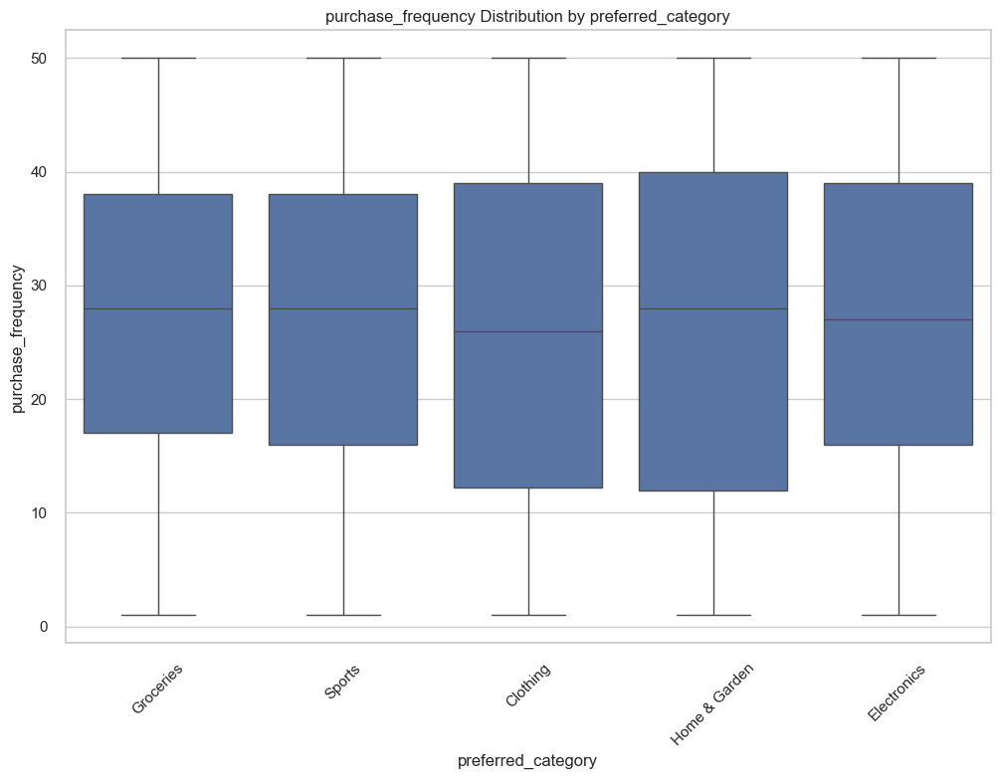

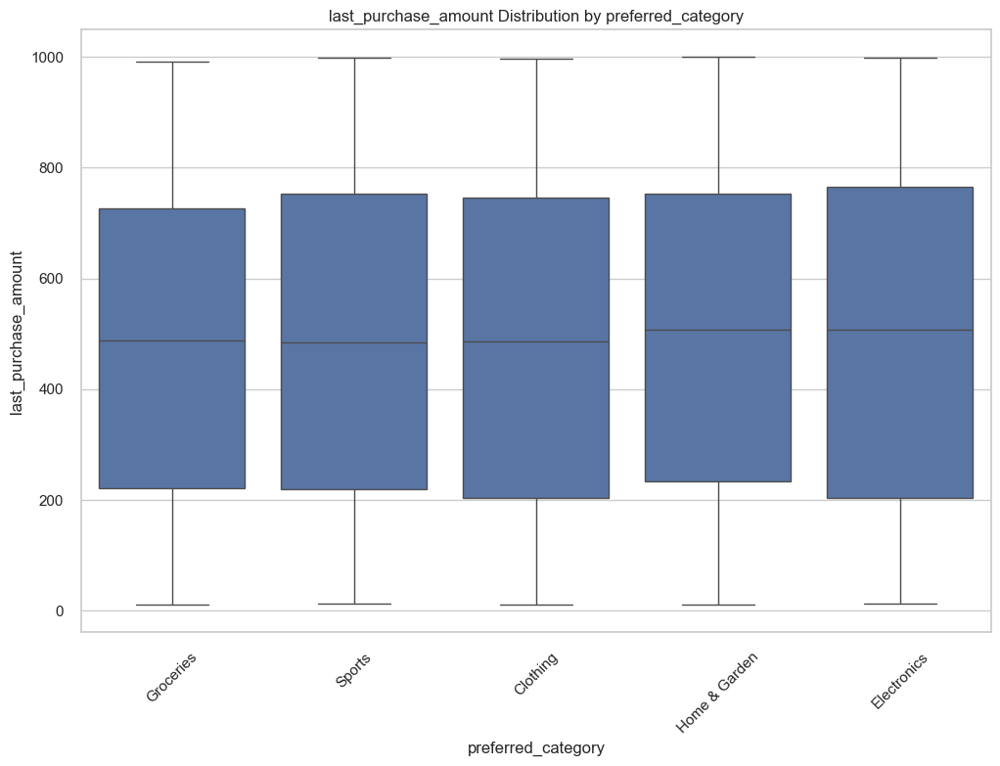

In [36]:
# Examining categorical and numerical variables together (boxplot)
for column in data.select_dtypes(include=[object]).columns:
    for num_column in data.select_dtypes(include=[np.number]).columns:
        plt.figure(figsize=(12, 8))
        sns.boxplot(x=column, y=num_column, data=data)
        plt.title(f'{num_column} Distribution by {column}')
        plt.xlabel(column)
        plt.ylabel(num_column)
        plt.xticks(rotation=45)
        plt.show()

In [37]:
# display the top 5 unique values of each column
print("\nTop 5 Unique Values of Each Column:")
for column in data.columns:
    print(f"\n{column} Top 5 Unique Values of Column:")
    print(data[column].unique()[:5])


Top 5 Unique Values of Each Column:

id Top 5 Unique Values of Column:
[1 2 3 4 5]

age Top 5 Unique Values of Column:
[38 21 60 40 65]

gender Top 5 Unique Values of Column:
['Female' 'Other' 'Male']

income Top 5 Unique Values of Column:
[ 99342  78852 126573  47099 140621]

spending_score Top 5 Unique Values of Column:
[90 60 30 74 21]

membership_years Top 5 Unique Values of Column:
[3 2 9 5 6]

purchase_frequency Top 5 Unique Values of Column:
[24 42 28  5 25]

preferred_category Top 5 Unique Values of Column:
['Groceries' 'Sports' 'Clothing' 'Home & Garden' 'Electronics']

last_purchase_amount Top 5 Unique Values of Column:
[113.53  41.93 424.36 991.93 347.08]


In [38]:
# create a pivot table showing income averages by gender and preferred category
print("\nIncome Averages by Gender and Preferred Category:")
pivot_table = data.pivot_table(values='income', index='gender', columns='preferred_category', aggfunc='mean')
print(pivot_table)


Income Averages by Gender and Preferred Category:
preferred_category      Clothing   Electronics     Groceries  Home & Garden  \
gender                                                                        
Female              93195.607143  88842.600000  83731.333333   85823.632353   
Male                87707.303571  87672.210526  88040.338028   92684.012987   
Other               87223.086207  90825.418919  91507.274194   87554.590164   

preferred_category        Sports  
gender                            
Female              89470.868852  
Male                88025.000000  
Other               85453.097222  


In [39]:
# select and standardize numeric columns
numeric_columns = data.select_dtypes(include=[np.number]).columns
scaler = StandardScaler()
scaled_data = scaler.fit_transform(data[numeric_columns])

In [40]:
# identify segments with the k-means clustering algorithm
kmeans = KMeans(n_clusters=5, random_state=0)
data['Cluster'] = kmeans.fit_predict(scaled_data)

In [41]:
# display the center and cluster sizes of each cluster
print("Cluster Centers:")
print(kmeans.cluster_centers_)
print("\nCluster Dimensions:")
print(data['Cluster'].value_counts())

Cluster Centers:
[[ 0.83747776  0.40304386 -0.73592357  0.05455845  0.17714289  0.57141484
   0.36922748]
 [-0.45902733  0.2039626  -0.16700096 -0.04698427 -0.55888048 -0.74462347
   0.86617044]
 [ 0.3069995   0.423402    0.64055283  0.18932174 -0.34577588 -0.64486328
  -0.88687681]
 [-0.94501889 -0.16587641 -0.40626584  0.23179696  0.73231278  0.27239318
  -0.46872088]
 [ 0.36183557 -0.88470892  0.73399702 -0.45495368 -0.03591346  0.57118896
   0.10823119]]

Cluster Dimensions:
Cluster
3    211
1    206
0    197
2    195
4    191
Name: count, dtype: int64


In [43]:
# reduce the data size to two dimensions with PCA
pca = PCA(n_components=2)
principal_components = pca.fit_transform(scaled_data)
data['PCA1'] = principal_components[:, 0]
data['PCA2'] = principal_components[:, 1]

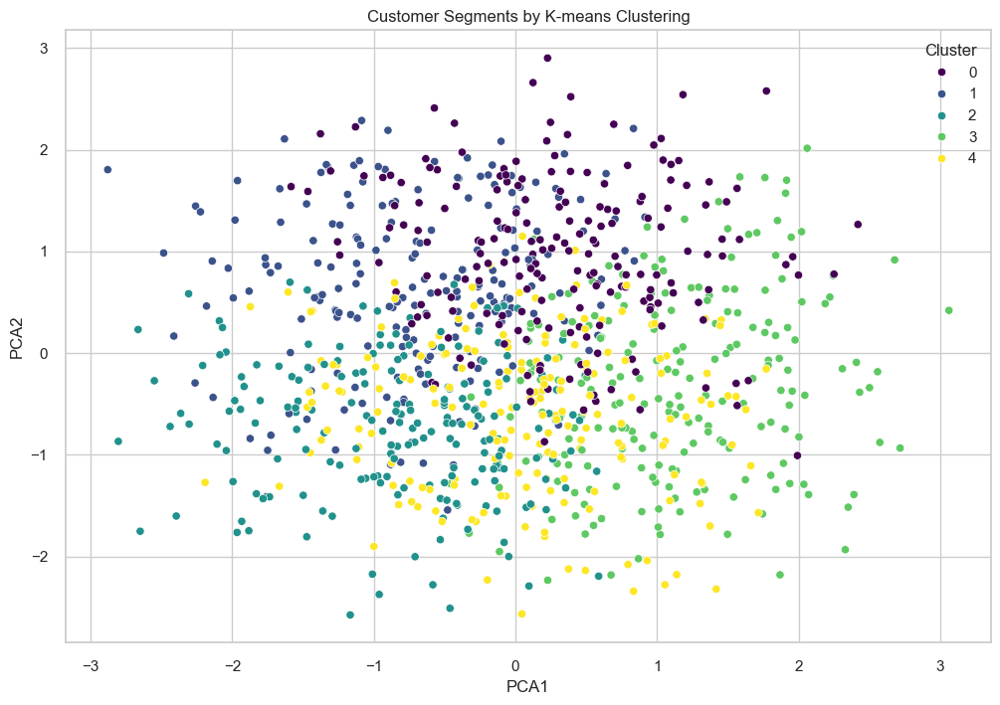

In [44]:
# visualize k-means cluster results
plt.figure(figsize=(12, 8))
sns.scatterplot(x='PCA1', y='PCA2', hue='Cluster', data=data, palette='viridis')
plt.title('Customer Segments by K-means Clustering')
plt.show()

In [45]:
# create a formula using the required columns to calculate CLV
# simple CLV formula: CLV = Average Purchase Value * Purchase Frequency * Customer Lifetime

average_purchase_value = data['last_purchase_amount'].mean()
purchase_frequency = data['purchase_frequency'].mean()
customer_lifespan = data['membership_years'].mean()

clv = average_purchase_value * purchase_frequency * customer_lifespan
print(f"\nCustomer Lifetime Value (CLV): {clv}")


Customer Lifetime Value (CLV): 71613.84908821309


In [46]:
# analyze to determine which categories can be cross-sold and upsold.
print("\nCross-Selling and Upselling Recommendations to Customers:")
category_combinations = pd.crosstab(data['preferred_category'], data['Cluster'])
print(category_combinations)


Cross-Selling and Upselling Recommendations to Customers:
Cluster              0   1   2   3   4
preferred_category                    
Clothing            33  38  34  40  25
Electronics         39  49  40  48  39
Groceries           44  37  41  41  36
Home & Garden       42  44  37  36  47
Sports              39  38  43  46  44


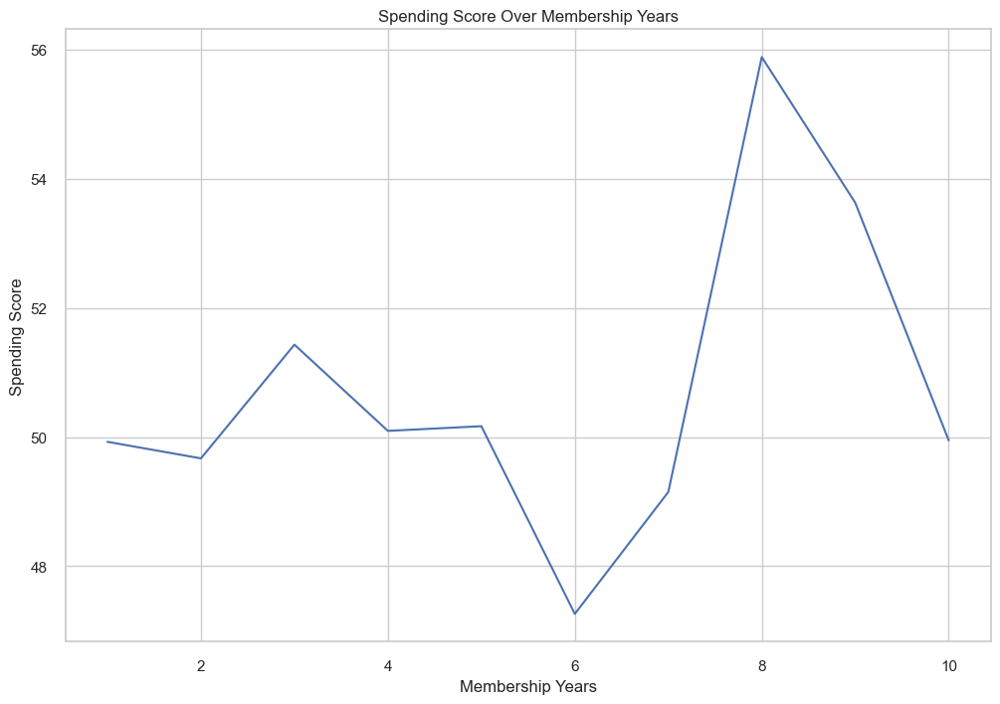

In [48]:
# visualize the spending score by membership years
plt.figure(figsize=(12, 8))
sns.lineplot(x='membership_years', y='spending_score', data=data, errorbar=None)
plt.title('Spending Score Over Membership Years')
plt.xlabel('Membership Years')
plt.ylabel('Spending Score')
plt.show()

In [49]:
# calculate the spending efficiency
data['spending_efficiency'] = data['spending_score'] / data['income']
print("\nSpending Efficiency:")
print(data[['spending_score', 'income', 'spending_efficiency']].head())


Spending Efficiency:
   spending_score  income  spending_efficiency
0              90   99342             0.000906
1              60   78852             0.000761
2              30  126573             0.000237
3              74   47099             0.001571
4              21  140621             0.000149


In [50]:
# specify properties and target variable
features = data.drop(['id', 'preferred_category', 'Cluster'], axis=1)
target = data['Cluster']

In [52]:
# divide it into training and test sets
X_train, X_test, y_train, y_test = train_test_split(features, target, test_size=0.2, random_state=42)

print("\nDimensions of Training and Test Sets:")
print(f"Training Set: {X_train.shape}, Test Set: {X_test.shape}")


Dimensions of Training and Test Sets:
Training Set: (800, 10), Test Set: (200, 10)


In [53]:
# select categorical columns
categorical_columns = data.select_dtypes(include=['object']).columns

In [57]:
# converting categorical data using One-Hot Encoder
encoder = OneHotEncoder(drop='first', sparse_output=False)
encoded_categorical_data = encoder.fit_transform(data[categorical_columns])

In [58]:
# create new column name
encoded_categorical_columns = encoder.get_feature_names_out(categorical_columns)

In [59]:
# convert it to DataFrame
encoded_categorical_df = pd.DataFrame(encoded_categorical_data, columns=encoded_categorical_columns)

In [60]:
# extract categorical columns from the original data and combine them with numerical data
numeric_data = data.drop(categorical_columns, axis=1)
processed_data = pd.concat([numeric_data, encoded_categorical_df], axis=1)

In [61]:
# specify properties and target variable
features = processed_data.drop(['id', 'Cluster'], axis=1)
target = data['Cluster']

# divide it into training and test sets
X_train, X_test, y_train, y_test = train_test_split(features, target, test_size=0.2, random_state=42)

In [62]:
# training a Random Forest model
model = RandomForestClassifier(n_estimators=100, random_state=42, max_features='sqrt')
model.fit(X_train, y_train)

# make predictions on the test set
y_pred = model.predict(X_test)

# evaluating the model
print("\nClassification Report:")
print(classification_report(y_test, y_pred))

print("\nComplexity Matrix:")
print(confusion_matrix(y_test, y_pred))


Classification Report:
              precision    recall  f1-score   support

           0       0.77      0.73      0.75        45
           1       0.77      0.77      0.77        43
           2       0.87      0.87      0.87        39
           3       0.75      0.81      0.78        37
           4       0.86      0.83      0.85        36

    accuracy                           0.80       200
   macro avg       0.80      0.80      0.80       200
weighted avg       0.80      0.80      0.80       200


Complexity Matrix:
[[33  8  0  4  0]
 [ 5 33  2  0  3]
 [ 1  0 34  3  1]
 [ 3  0  3 30  1]
 [ 1  2  0  3 30]]


In [63]:
# Calculate ROC curve and AUC score for each class
n_classes = len(np.unique(y_train))
y_test_bin = pd.get_dummies(y_test).values
y_pred_prob = model.predict_proba(X_test)

fpr = dict()
tpr = dict()
roc_auc = dict()

for i in range(n_classes):
    fpr[i], tpr[i], _ = roc_curve(y_test_bin[:, i], y_pred_prob[:, i])
    roc_auc[i] = roc_auc_score(y_test_bin[:, i], y_pred_prob[:, i])

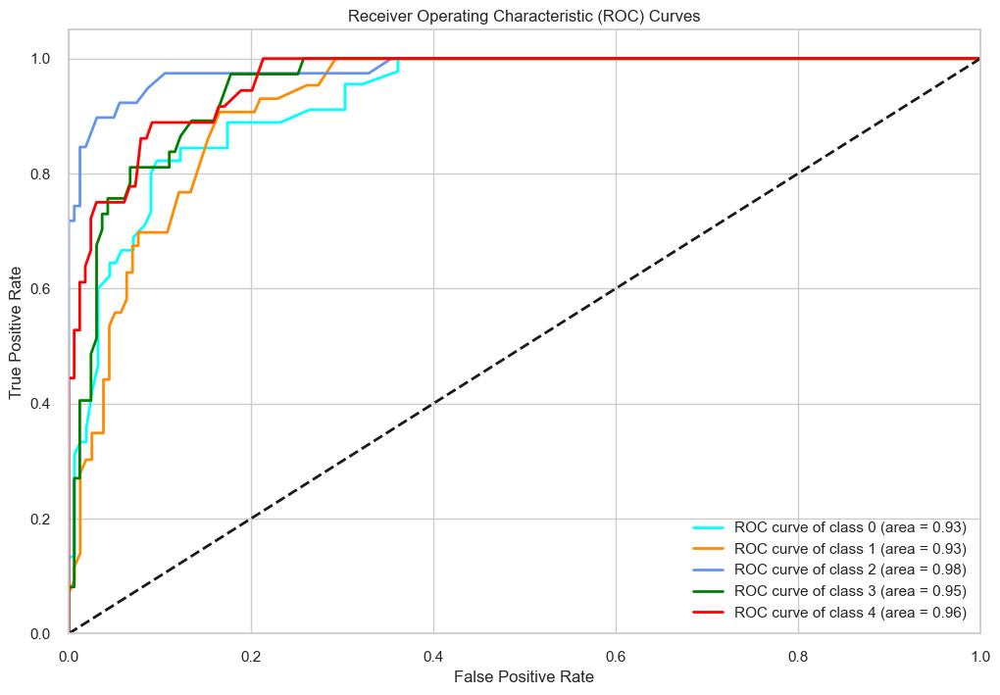

In [64]:
# ROC curve plot
plt.figure(figsize=(12, 8))
colors = ['aqua', 'darkorange', 'cornflowerblue', 'green', 'red']
for i, color in zip(range(n_classes), colors):
    plt.plot(fpr[i], tpr[i], color=color, lw=2,
             label=f'ROC curve of class {i} (area = {roc_auc[i]:0.2f})')

plt.plot([0, 1], [0, 1], 'k--', lw=2)
plt.xlim([0.0, 1.0])
plt.ylim([0.0, 1.05])
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('Receiver Operating Characteristic (ROC) Curves')
plt.legend(loc="lower right")
plt.show()

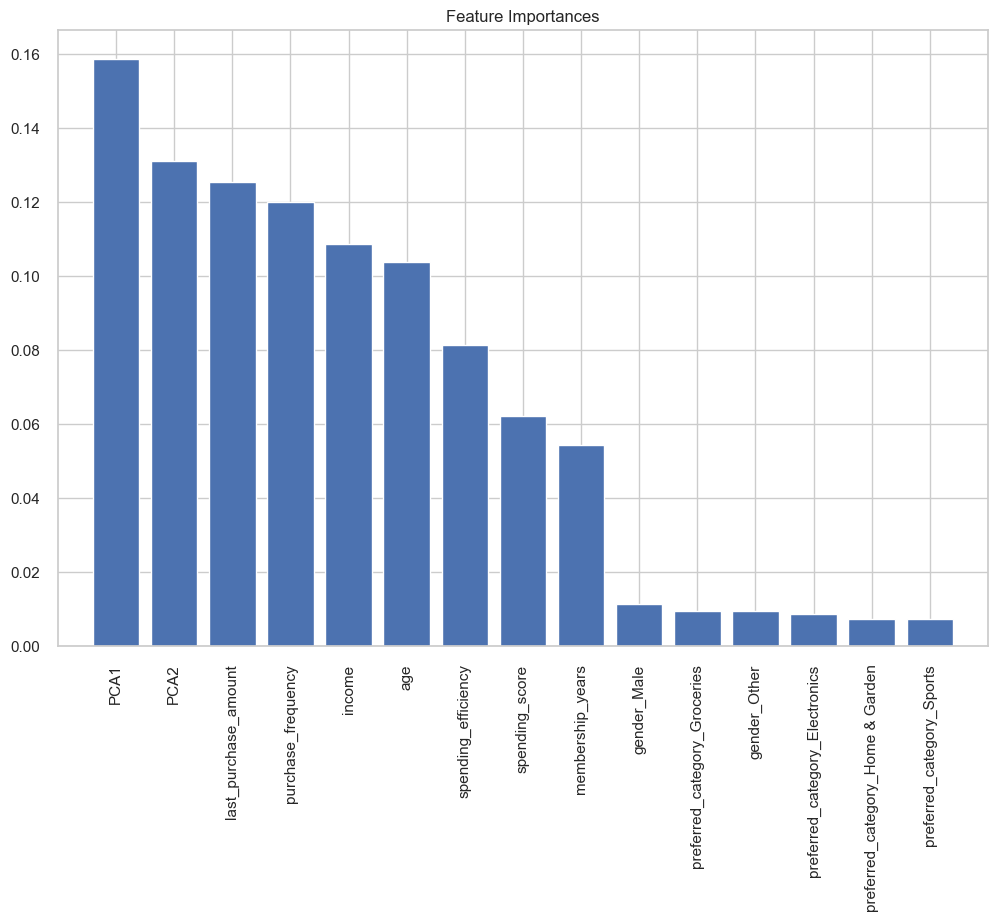

In [65]:
# calculate and visualize feature importance
importances = model.feature_importances_
indices = np.argsort(importances)[::-1]

plt.figure(figsize=(12, 8))
plt.title("Feature Importances")
plt.bar(range(X_train.shape[1]), importances[indices], align="center")
plt.xticks(range(X_train.shape[1]), features.columns[indices], rotation=90)
plt.xlim([-1, X_train.shape[1]])
plt.show()

In [67]:
# calculate average values by selecting only numeric columns
numeric_columns = data.select_dtypes(include=[np.number]).columns
segment_means = data.groupby('Cluster')[numeric_columns].mean()
print(segment_means)

                 id        age         income  spending_score  \
Cluster                                                         
0        742.258883  49.842640   63322.167513       52.263959   
1        367.990291  46.849515   82787.087379       49.325243   
2        589.123077  50.148718  110416.451282       56.164103   
3        227.696682  41.289100   74600.962085       57.393365   
4        604.952880  30.481675  113613.518325       37.518325   

         membership_years  purchase_frequency  last_purchase_amount  Cluster  \
Cluster                                                                        
0                5.974619           34.730964            601.490964      0.0   
1                3.873786           15.995146            748.385485      1.0   
2                4.482051           17.415385            230.191128      2.0   
3                7.559242           30.473934            353.796493      3.0   
4                5.366492           34.727749            524.341

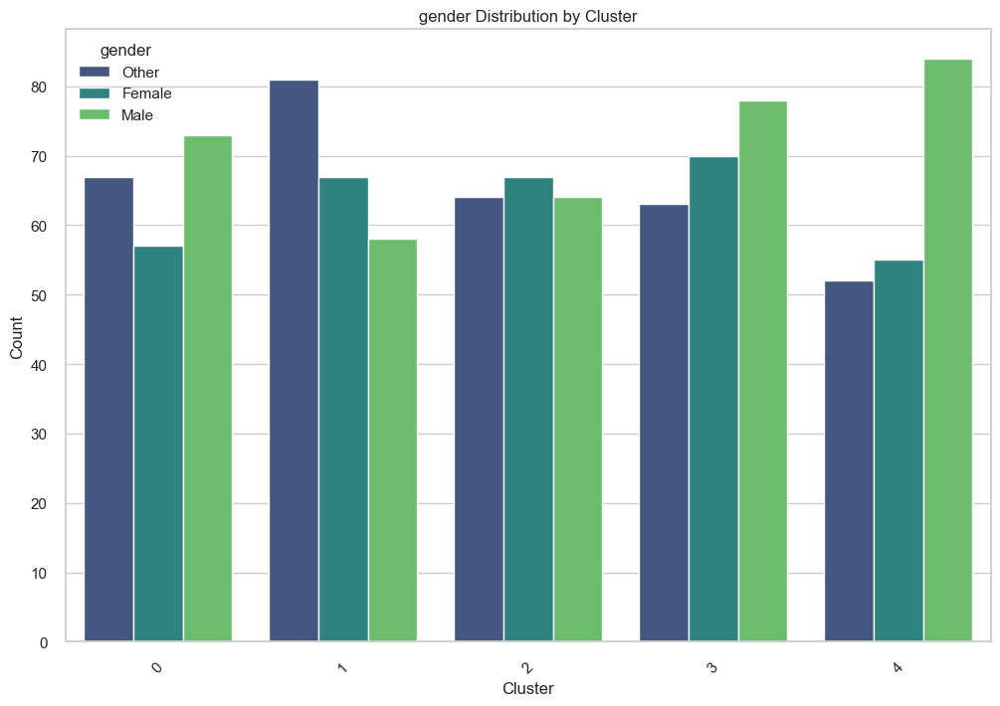

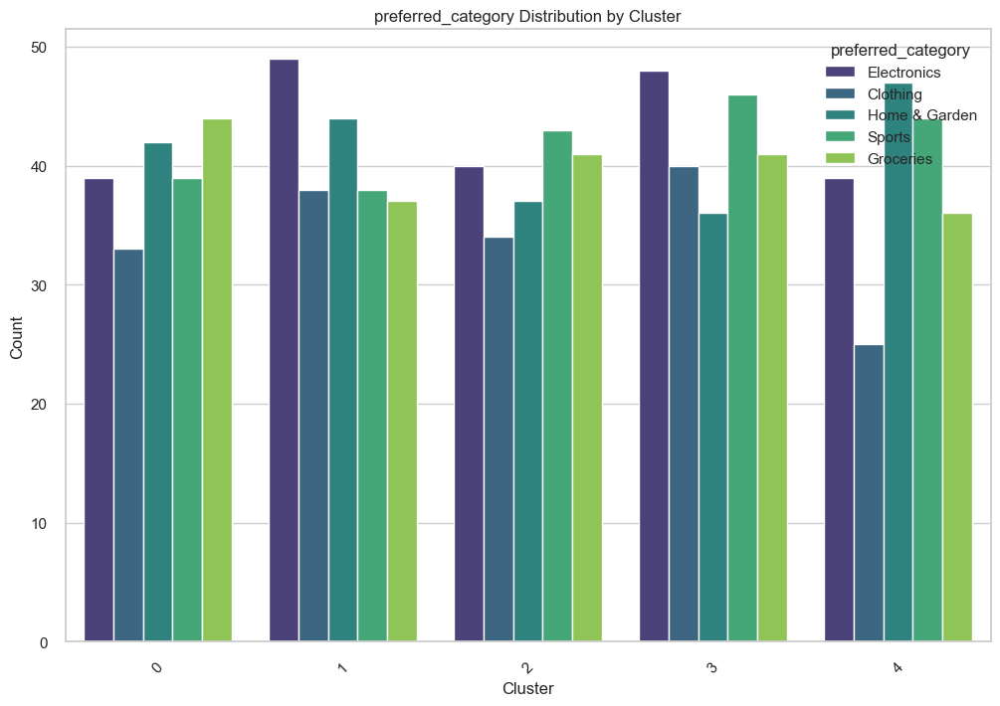

In [68]:
# visualize the categorical distributions of each segment
categorical_columns = data.select_dtypes(include=['object']).columns
for col in categorical_columns:
    plt.figure(figsize=(12, 8))
    sns.countplot(x='Cluster', hue=col, data=data, palette='viridis')
    plt.title(f'{col} Distribution by Cluster')
    plt.xlabel('Cluster')
    plt.ylabel('Count')
    plt.xticks(rotation=45)
    plt.show()

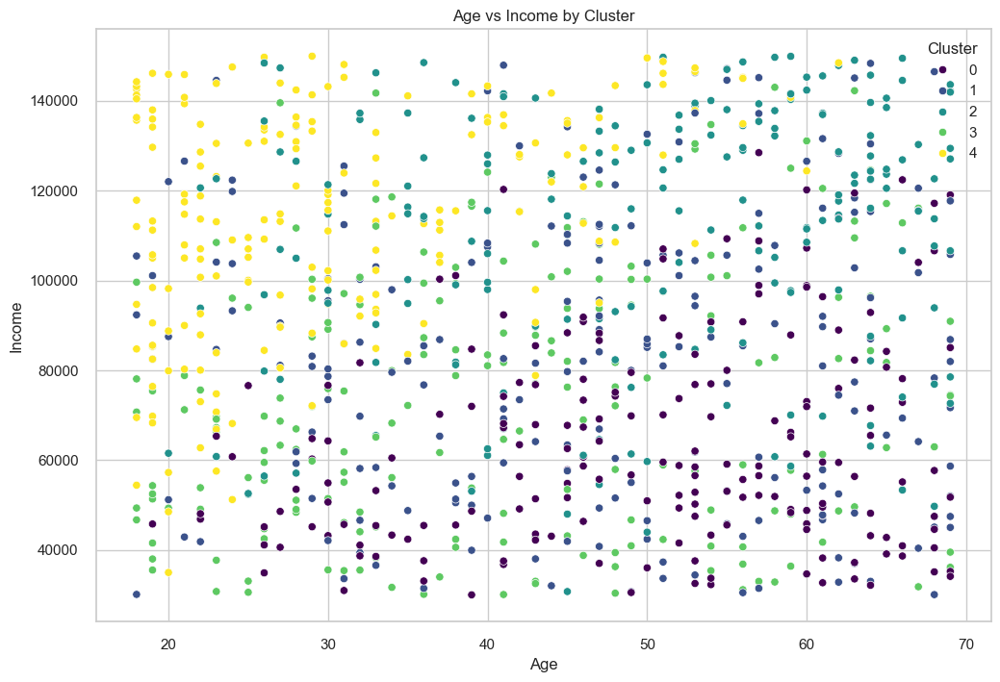

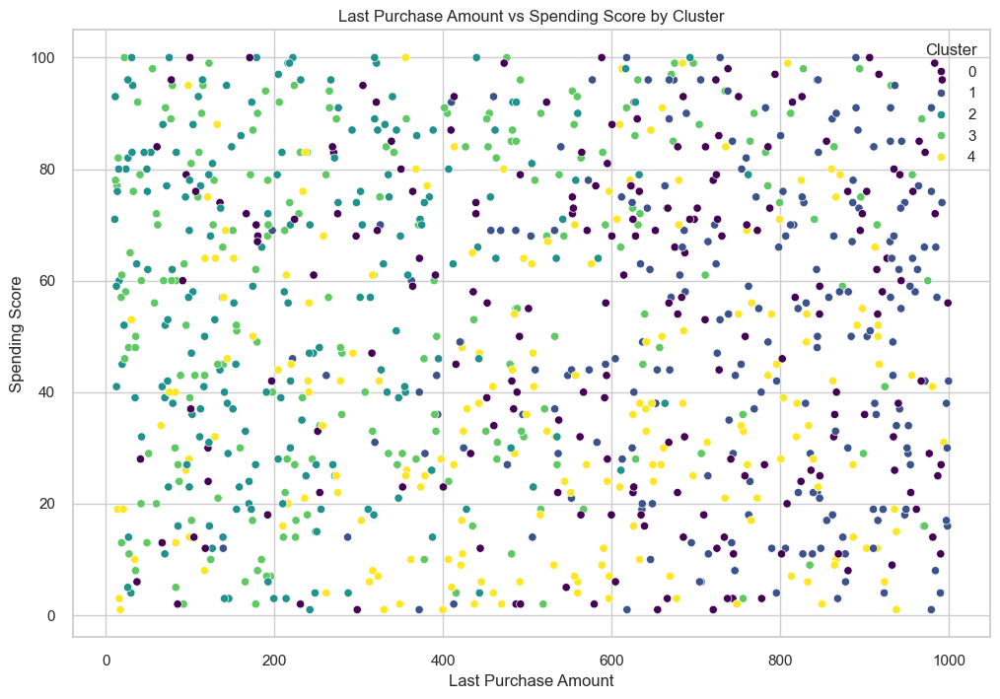

In [69]:
# visualize income and age distributions
plt.figure(figsize=(12, 8))
sns.scatterplot(x='age', y='income', hue='Cluster', data=data, palette='viridis')
plt.title('Age vs Income by Cluster')
plt.xlabel('Age')
plt.ylabel('Income')
plt.show()

# examining the relationship between spending score and last purchase amount
plt.figure(figsize=(12, 8))
sns.scatterplot(x='last_purchase_amount', y='spending_score', hue='Cluster', data=data, palette='viridis')
plt.title('Last Purchase Amount vs Spending Score by Cluster')
plt.xlabel('Last Purchase Amount')
plt.ylabel('Spending Score')
plt.show()

In [70]:
# define the hyperparameter grid
param_grid = {
    'n_estimators': [100, 200, 300],
    'max_features': ['auto', 'sqrt', 'log2'],
    'max_depth': [4, 6, 8, 10],
    'criterion': ['gini', 'entropy']
}

# find the best hyperparameters with Grid Search
grid_search = GridSearchCV(estimator=model, param_grid=param_grid, cv=5, n_jobs=-1)
grid_search.fit(X_train, y_train)

print("\nBest Hyperparameters:")
print(grid_search.best_params_)

# retrain with the best model
best_model = grid_search.best_estimator_
best_model.fit(X_train, y_train)

C:\Users\tahaa\AppData\Local\Programs\Python\Python312\Lib\site-packages\sklearn\model_selection\_validation.py:540: FitFailedWarning: 
120 fits failed out of a total of 360.
The score on these train-test partitions for these parameters will be set to nan.
If these failures are not expected, you can try to debug them by setting error_score='raise'.

Below are more details about the failures:
--------------------------------------------------------------------------------
60 fits failed with the following error:
Traceback (most recent call last):
  File "C:\Users\tahaa\AppData\Local\Programs\Python\Python312\Lib\site-packages\sklearn\model_selection\_validation.py", line 888, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "C:\Users\tahaa\AppData\Local\Programs\Python\Python312\Lib\site-packages\sklearn\base.py", line 1466, in wrapper
    estimator._validate_params()
  File "C:\Users\tahaa\AppData\Local\Programs\Python\Python312\Lib\site-packages\sklearn\base.


Best Hyperparameters:
{'criterion': 'entropy', 'max_depth': 10, 'max_features': 'sqrt', 'n_estimators': 300}


RandomForestClassifier(criterion='entropy', max_depth=10, n_estimators=300,
                       random_state=42)

In [71]:
# describe different models
models = {
    'RandomForest': RandomForestClassifier(n_estimators=100, random_state=42),
    'GradientBoosting': GradientBoostingClassifier(n_estimators=100, random_state=42),
    'SVM': SVC(probability=True, random_state=42),
    'KNN': KNeighborsClassifier(n_neighbors=5)
}

# train and evaluate models
for name, model in models.items():
    model.fit(X_train, y_train)
    y_pred = model.predict(X_test)
    print(f"\n{name} Classification Report:")
    print(classification_report(y_test, y_pred))
    print(f"\n{name} Complexity Matrix:")
    print(confusion_matrix(y_test, y_pred))


RandomForest Classification Report:
              precision    recall  f1-score   support

           0       0.77      0.73      0.75        45
           1       0.77      0.77      0.77        43
           2       0.87      0.87      0.87        39
           3       0.75      0.81      0.78        37
           4       0.86      0.83      0.85        36

    accuracy                           0.80       200
   macro avg       0.80      0.80      0.80       200
weighted avg       0.80      0.80      0.80       200


RandomForest Complexity Matrix:
[[33  8  0  4  0]
 [ 5 33  2  0  3]
 [ 1  0 34  3  1]
 [ 3  0  3 30  1]
 [ 1  2  0  3 30]]

GradientBoosting Classification Report:
              precision    recall  f1-score   support

           0       0.73      0.71      0.72        45
           1       0.72      0.72      0.72        43
           2       0.92      0.85      0.88        39
           3       0.76      0.86      0.81        37
           4       0.83      0.81     

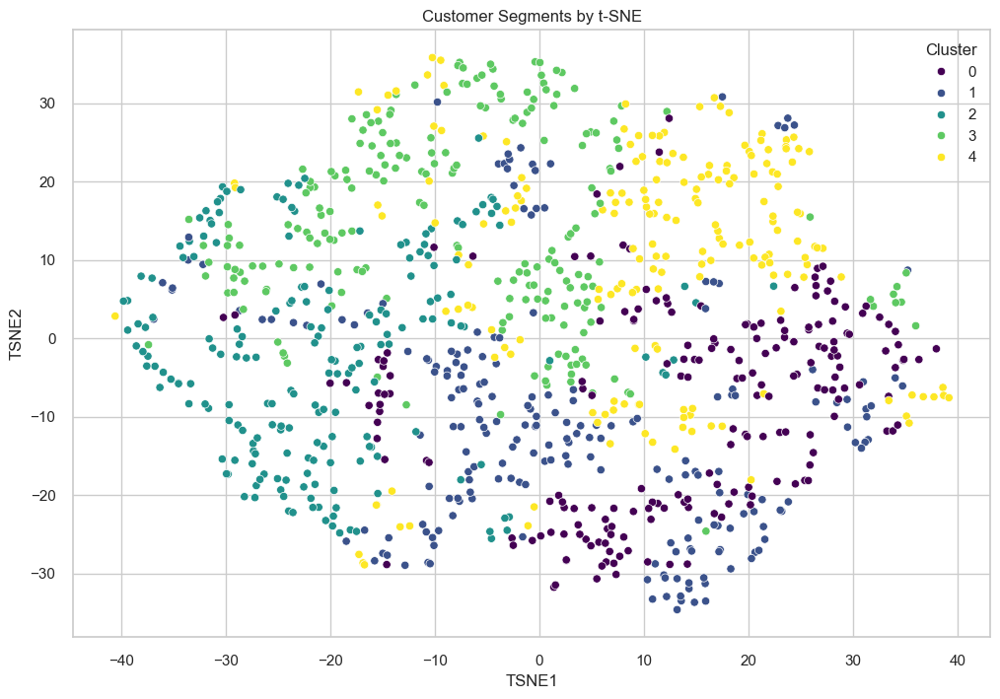

In [72]:
# reduce the data to two dimensions with t-SNE
tsne = TSNE(n_components=2, random_state=42)
tsne_results = tsne.fit_transform(scaled_data)

data['TSNE1'] = tsne_results[:, 0]
data['TSNE2'] = tsne_results[:, 1]

# visualize t-SNE results
plt.figure(figsize=(12, 8))
sns.scatterplot(x='TSNE1', y='TSNE2', hue='Cluster', data=data, palette='viridis')
plt.title('Customer Segments by t-SNE')
plt.show()

In [73]:
# define the RandomForest model
rf_model = RandomForestClassifier(n_estimators=100, random_state=42)

# Feature selection with RFE
selector = RFE(rf_model, n_features_to_select=5, step=1)
selector = selector.fit(X_train, y_train)

# Selected features
selected_features = X_train.columns[selector.support_]
print("Selected features:", selected_features)

Selected features: Index(['income', 'purchase_frequency', 'last_purchase_amount', 'PCA1', 'PCA2'], dtype='object')


In [74]:
# create training and test sets with the selected features
X_train_selected = selector.transform(X_train)
X_test_selected = selector.transform(X_test)

# train the model with selected features
rf_model.fit(X_train_selected, y_train)

# make predictions on the test set
y_pred_selected = rf_model.predict(X_test_selected)

# evaluating the model
print("\nClassification Report with Selected Features:")
print(classification_report(y_test, y_pred_selected))

print("\nComplexity Matrix with Selected Features:")
print(confusion_matrix(y_test, y_pred_selected))


Classification Report with Selected Features:
              precision    recall  f1-score   support

           0       0.70      0.67      0.68        45
           1       0.69      0.72      0.70        43
           2       0.82      0.85      0.84        39
           3       0.78      0.78      0.78        37
           4       0.74      0.72      0.73        36

    accuracy                           0.74       200
   macro avg       0.75      0.75      0.75       200
weighted avg       0.74      0.74      0.74       200


Complexity Matrix with Selected Features:
[[30  9  1  4  1]
 [ 7 31  2  0  3]
 [ 2  1 33  1  2]
 [ 2  0  3 29  3]
 [ 2  4  1  3 26]]


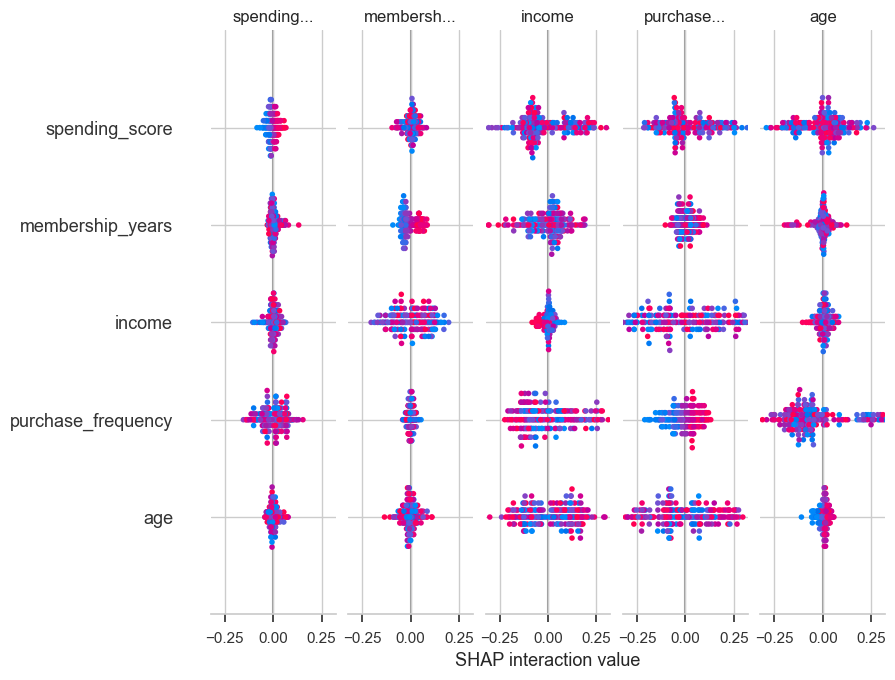

In [75]:
# train the RandomForest model
rf_model = RandomForestClassifier(n_estimators=100, random_state=42)
rf_model.fit(X_train, y_train)

# calculate SHAP values
explainer = shap.TreeExplainer(rf_model)
shap_values = explainer.shap_values(X_test)

# SHAP summary chart
shap.summary_plot(shap_values, X_test, plot_type="bar")

In [90]:
# SHAP summary plot (dot plot)
#shap.summary_plot(shap_values, X_test)

# SHAP force plot for a custom data point
#index = 0  # Index of the data point to be examined

# Check if it's a binary classifier
#if len(shap_values.shape) == 2:
 #   base_value = explainer.expected_value
  #  shap_val = shap_values[index]
#else:  # Handle multiclass classification
 #   class_index = 1  # The class index you want to examine
  #  base_value = explainer.expected_value[class_index]
   # shap_val = shap_values[class_index][index]

# Ensure dimensions match
#print("Base value:", base_value)
#print("SHAP value shape:", shap_val.shape)
#print("Features shape:", X_test.iloc[index].shape)

#shap.force_plot(
 #   base_value, 
  #  shap_val, 
   # X_test.iloc[index], 
    #matplotlib=True
#)

In [79]:
print(len(shap_values[1][index]))
print(X_test.iloc[index].shape)

5
(15,)


In [80]:
print(explainer.expected_value)
print(shap_values.shape)

[0.188675  0.2039625 0.195125  0.2165875 0.19565  ]
(200, 15, 5)


In [81]:
print(index)
print(len(X_test))

0
200


In [82]:
print(shap_values[1].shape)  # Check the dimensions for the second class

(15, 5)


In [86]:
print("Shape of shap_values for class index 1:", shap_values[1].shape)
print("Number of features in X_test.iloc[index]:", X_test.iloc[index].shape[0])

Shape of shap_values for class index 1: (15, 5)
Number of features in X_test.iloc[index]: 15


In [87]:
print("Expected value shape:", explainer.expected_value.shape)

Expected value shape: (5,)


In [88]:
print("Index used:", index)
print("Length of X_test:", len(X_test))

Index used: 0
Length of X_test: 200


# The data analysis and modeling work I do focuses on customer segmentation and classification. Below, the results of each step and their interpretation are discussed in detail: